# Predicting Credit Card Customer Defaults Using Machine Learning Classification Models

This notebook focuses on building classification models to predict whether a credit card customer will default on their payments. The target variable "default," serves as the dependent variable, while the remaining columns represent independent features related to customer characteristics and financial behavior. To achieve this, we will implement and compare multiple machine learning algorithms, including Decision Trees, Bagging, Random Forest, Boosting, and K-Nearest Neighbors (KNN). The workflow will include data preprocessing, model training, evaluation, and performance comparison to determine the most effective model for predicting defaults.

# Table of Contents


1. [Dataset Description](#dataset-description)
   - [1.1 Import of Libraries](#11-import-of-libraries)
   - [1.2 Reading the Dataset for Analysis](#12-reading-the-dataset-for-analysis)
2. [Data Manipulation](#data-manipulation)
   - [2.1 Checking and Dropping Null Values](#21-checking-and-dropping-null-values)
   - [2.2 Descriptive Statistics](#22-descriptive-statistics)
   - [2.3 One-Hot Encoding](#23-one-hot-encoding)
3. [Modeling Classification Algorithms](#modeling-classification-algorithms)
   - [3.1 Model #1: Decision Trees](#31-model-1-decision-trees)
        - [3.1.1 Selecting Train and Test Datasets](#311-selecting-train-and-test-datasets)
        - [3.1.2 Checking Data Stratification](#312-checking-data-stratification)
        - [3.1.3 Model](#313-model)
        - [3.1.4 Tree Without Pruning](#314-tree-without-pruning)
        - [3.1.5 Accuracy of the Model](#315-accuracy-of-the-model)
        - [3.1.6 Information Gain](#316-information-gain)
        - [3.1.7 Grid Search](#317-grid-search)
        - [3.1.8 Pruned Tree](#318-pruned-tree)
        - [3.1.9 Confusion Matrix](#319-confusion-matrix)
        - [3.1.10 Precision and Recall Trade-Off](#3110-precision-and-recall-trade-off)
        - [3.1.11 ROC Curve](#3111-roc-curve)
        - [3.1.12 Model #1 Performance](#3112-model-1-performance)
   - [3.2 Model #2: Bagging](#32-model-2-bagging)
        - [3.2.1 Selecting Train and Test Datasets](#321-selecting-train-and-test-datasets)
        - [3.2.2 Model (OOB Score)](#322-model-oob-score)
        - [3.2.3 Grid Search](#323-grid-search)
        - [3.2.4 Model After Grid Search](#324-model-after-grid-search)
         - [3.2.5 Confusion Matrix](#325-confusion-matrix)
        - [3.2.6 Precision and Recall](#326-precision-and-recall)
        - [3.2.7 ROC Curve](#327-roc-curve)
        - [3.2.8 Model #2 Performance](#328-model-2-performance)
   - [3.3 Model #3: Random Forest](#33-model-3-random-forest)
        - [3.3.1 Selecting Train and Test Datasets](#331-selecting-train-and-test-datasets)
        - [3.3.2 Model](#332-model)
        - [3.3.3 Grid Search](#333-grid-search)
        - [3.3.4 Model After Grid Search](#334-model-after-grid-search)
        - [3.3.5 Confusion Matrix](#335-confusion-matrix)
        - [3.3.6 Precision and Recall](#336-precision-and-recall)
         - [3.3.7 ROC Curve](#337-roc-curve)
        - [3.3.8 Model #3 Performance](#338-model-3-performance)
   - [3.4 Model #4: Boosting](#34-model-4-boosting)
        - [3.4.1 Selecting Train and Test Datasets](#341-selecting-train-and-test-datasets)
        - [3.4.2 Model](#342-model)
        - [3.4.3 Grid Search](#343-grid-search)
        - [3.4.4 Model After Grid Search](#344-model-after-grid-search)
        - [3.4.5 Confusion Matrix](#345-confusion-matrix)
        - [3.4.6 Precision and Recall](#346-precision-and-recall)
        - [3.4.7 ROC Curve](#347-roc-curve)
        - [3.4.8 Model #4 Performance](#348-model-4-performance)
   - [3.5 Model #5: KNN](#35-model-5-knn)
        - [3.5.1 Dropping Some Variables for KNN](#351-dropping-some-variables-for-knn)
        - [3.5.2 Selecting Train and Test Datasets](#352-selecting-train-and-test-datasets)
        - [3.5.3 Standardizing Estimators](#353-standardizing-estimators)
        - [3.5.4 Model](#354-model)
        - [3.5.5 Grid Search](#355-grid-search)
        - [3.5.6 Model After Grid Search](#356-model-after-grid-search)
        - [3.5.7 Confusion Matrix](#357-confusion-matrix)
        - [3.5.8 Precision and Recall](#358-precision-and-recall)
        - [3.5.9 ROC Curve](#359-roc-curve)
        - [3.5.10 Model #5 Performance](#3510-model-5-performance)
4. [Model Comparison](#4-model-comparison)

# 1. Dataset Description

The dataset contains information about credit card customers, including demographic details, credit history, and repayment behavior. Below is a description of each variable in the dataset:

- ID: Unique identifier for each customer.
- LIMIT_BAL: The total amount of credit extended to the customer (measured in NT dollars).
- SEX: Gender of the customer (male or female).
- EDUCATION: Highest education level attained (graduate school, university, high school, or others).
- MARRIAGE: Marital status of the customer (married, single, or others).
- AGE: Age of the customer in years.
- PAY_0 to PAY_6: Repayment status for the current month and the past five months (-2 indicates no consumption,
-1 means payment was made on time, 0 represents the use of revolving credit and positive values indicate the number of months the payment has been delayed).
- BILL_AMT1 to BILL_AMT6: Monthly statement bill amounts for the current and past five months (NT dollars).
- PAY_AMT1 to PAY_AMT6: Amount paid by the customer for the current and past five months (NT dollars).
- default_payment_next_month: The target variable indicating whether the customer will default next month (1 = Yes, 0 = No)

This dataset provides key financial indicators and behavioral patterns that will be used to train and evaluate classification models for predicting customer defaults.



## 1.1 Import of libraries

In [1]:
import pandas as pd
import numpy as np
import graphviz
import warnings
import seaborn as sns
import pydotplus
from io import StringIO
import matplotlib.pyplot as plt
from sklearn import tree
from xgboost import XGBClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_curve, f1_score, accuracy_score, precision_recall_curve, confusion_matrix, classification_report, recall_score, precision_score, roc_auc_score, precision_recall_fscore_support, mean_squared_error
from sklearn import metrics
from fastai.imports import *
from fastai.tabular import *
from sklearn.neighbors import KNeighborsClassifier
from pandas_summary import DataFrameSummary
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from IPython.display import display, Image
from matplotlib.ticker import FuncFormatter
from sklearn.tree import DecisionTreeClassifier, export_graphviz
warnings.simplefilter(action='ignore', category=FutureWarning)
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings('ignore', category=UndefinedMetricWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=UndefinedMetricWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

## 1.2 Reading the dataset for the analysis

In [2]:
df = pd.read_csv(R"cleaned_credit_card_data.csv")
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
0,1,20000,female,university,married,24,2,2,-1,-1,...,0.0,0.0,0.0,0.00,689.0,0,0.0,0.0,0.0,1
1,2,120000,female,university,single,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.00,1000.0,1000,1000.0,0.0,2000.0,1
2,3,90000,female,university,single,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.00,1500.0,1000,1000.0,1000.0,5000.0,0
3,4,50000,female,university,married,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.00,2019.0,1200,1100.0,1069.0,1000.0,0
4,5,50000,male,university,married,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.00,36681.0,10000,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,male,high school,married,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.00,20000.0,5003,3047.0,5000.0,1000.0,0
29996,29997,150000,male,high school,single,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.00,3526.0,8998,129.0,0.0,0.0,0
29997,29998,30000,male,university,single,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.00,0.0,22000,4200.0,2000.0,3100.0,1
29998,29999,80000,male,high school,married,41,1,-1,0,0,...,52774.0,11855.0,48944.0,66522.18,3409.0,1178,1926.0,52964.0,1804.0,1


# 2. Data Manipulation

In the initial phase of the project, we performed several transformations on the dataset to ensure it was clean, structured, and suitable for machine learning algorithms. This process involved handling missing values, correcting inconsistencies, and encoding categorical variables to maintain data integrity. Additionally, we standardized numerical features where necessary to improve model performance. These transformations prevent inaccuracies in model training and enhance data consistency, optimizing the dataset for accurate and reliable predictions in subsequent machine learning tasks, including Decision Trees, Bagging, Random Forest, Boosting, and KNN algorithms.

### 2.1 Checking and dropping the null values of the dataset.

In [3]:
df.isna().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default_payment_next_month    0
dtype: int64

### 2.2 Descriptive Statistics

In [4]:
df.describe()

,ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,166808.656000,35.447167,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,50423.283733,...,42510.317067,39581.215733,38200.797233,5029.561633,5088.719567,4555.447400,4246.447100,4200.113300,4553.894133,0.221200
std,8660.398374,127584.472995,9.090242,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,69304.686094,...,60049.132356,56585.314536,55409.361537,9430.870444,10341.622162,9560.267421,9272.507135,9063.279373,11039.458690,0.415062
min,1.000000,10000.000000,22.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-81.000000,...,-212.020000,-232.010000,-331.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,...,2326.750000,1763.000000,1256.000000,1000.000000,833.000000,390.000000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,...,19052.000000,18104.500000,17071.000000,2100.000000,2009.000000,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5000.000000,4505.000000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,500000.000000,60.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,350110.680000,...,304997.270000,285868.330000,279505.060000,66522.180000,76651.020000,70000.000000,67054.440000,65607.560000,82619.050000,1.000000


### 2.3 One - Hot encoding

To prepare the dataset for machine learning models, we applied one-hot encoding to categorical variables such as "SEX," "EDUCATION," and "MARRIAGE." This transformation ensures that categorical data is represented numerically without introducing ordinal relationships where they do not exist, making the dataset more suitable for classification algorithms. Additionally, we restructured the "PAY" variables, which indicate repayment status over multiple months. Since the values -2, -1, and 0 have distinct meanings, we created new binary features to indicate whether a customer was using revolving credit cards (PAY <= 0). For cases where payments were delayed (PAY > 0), we created separate numerical features capturing the number of months the payment was overdue. This transformation preserves important financial behavior while improving model interpretability and predictive performance. Finally, the original "PAY" columns were dropped to prevent redundancy and ensure that the dataset remains structured and optimized for classification tasks.

In [5]:
# Perform one-hot encoding for the columns 'SEX', 'EDUCATION' and 'MARRIAGE'
df = pd.get_dummies(df, columns=['SEX', 'EDUCATION', 'MARRIAGE'], drop_first=True)

# Replace True with 1 and False with 0
df = df.replace({True: 1, False: 0})

# Ouptput: DataFrame with dummy variables
df.head()

,ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,...,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month,SEX_male,EDUCATION_high school,EDUCATION_others,EDUCATION_university,MARRIAGE_others,MARRIAGE_single
0,1,20000,24,2,2,-1,-1,-2,-2,3913.0,...,0.0,0.0,0.0,1,0,0,0,1,0,0
1,2,120000,26,-1,2,0,0,0,2,2682.0,...,1000.0,0.0,2000.0,1,0,0,0,1,0,1
2,3,90000,34,0,0,0,0,0,0,29239.0,...,1000.0,1000.0,5000.0,0,0,0,0,1,0,1
3,4,50000,37,0,0,0,0,0,0,46990.0,...,1100.0,1069.0,1000.0,0,0,0,0,1,0,0
4,5,50000,57,-1,0,-1,0,0,0,8617.0,...,9000.0,689.0,679.0,0,1,0,0,1,0,0


In [6]:
# Creating the new 'RC' variables capturing the customers that use revolving credit cards
df['RC_1'] = [1 if df['PAY_0'][i]==0 else 0 for i in range(len(df['PAY_0']))]
df['RC_2'] = [1 if df['PAY_2'][i]==0 else 0 for i in range(len(df['PAY_2']))]
df['RC_3'] = [1 if df['PAY_3'][i]==0 else 0 for i in range(len(df['PAY_3']))]
df['RC_4'] = [1 if df['PAY_4'][i]==0 else 0 for i in range(len(df['PAY_4']))]
df['RC_5'] = [1 if df['PAY_5'][i]==0 else 0 for i in range(len(df['PAY_5']))]
df['RC_6'] = [1 if df['PAY_6'][i]==0 else 0 for i in range(len(df['PAY_6']))]

# Creating the new 'PAYMENT_MONTH_DELAY' variables capturing the number of months the payment was overdue
df['PAYMENT_MONTH_DELAY_1'] = [df['PAY_0'][i] if df['PAY_0'][i] in range(1,9) else 0 for i in range(len(df['PAY_0']))]
df['PAYMENT_MONTH_DELAY_2'] = [df['PAY_2'][i] if df['PAY_2'][i] in range(1,9) else 0 for i in range(len(df['PAY_2']))]
df['PAYMENT_MONTH_DELAY_3'] = [df['PAY_3'][i] if df['PAY_3'][i] in range(1,9) else 0 for i in range(len(df['PAY_3']))]
df['PAYMENT_MONTH_DELAY_4'] = [df['PAY_4'][i] if df['PAY_4'][i] in range(1,9) else 0 for i in range(len(df['PAY_4']))]
df['PAYMENT_MONTH_DELAY_5'] = [df['PAY_5'][i] if df['PAY_5'][i] in range(1,9) else 0 for i in range(len(df['PAY_5']))]
df['PAYMENT_MONTH_DELAY_6'] = [df['PAY_6'][i] if df['PAY_6'][i] in range(1,9) else 0 for i in range(len(df['PAY_6']))]

df.drop(columns=[f'PAY_{i}' for i in [0,2,3,4,5,6]], inplace = True)
df.drop(columns = 'ID', inplace = True)

df.head()

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,...,RC_3,RC_4,RC_5,RC_6,PAYMENT_MONTH_DELAY_1,PAYMENT_MONTH_DELAY_2,PAYMENT_MONTH_DELAY_3,PAYMENT_MONTH_DELAY_4,PAYMENT_MONTH_DELAY_5,PAYMENT_MONTH_DELAY_6
0,20000,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,...,0,0,0,0,2,2,0,0,0,0
1,120000,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,...,1,1,1,0,0,2,0,0,0,2
2,90000,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,...,1,1,1,1,0,0,0,0,0,0
3,50000,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,...,1,1,1,1,0,0,0,0,0,0
4,50000,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,...,0,1,1,1,0,0,0,0,0,0


# 3. Modeling Classification Algorithms

In the modeling phase, we implement various classification algorithms, including Decision Trees, Bagging, Random Forest, Boosting, and K-Nearest Neighbors (KNN), to predict credit card customer defaults. To ensure model reliability and generalization, we begin by stratifying the dataset into training and testing sets, preserving the distribution of the target variable. For ensemble methods like Bagging and Random Forest, we apply bootstrapping, which enhances model robustness by training multiple models on random subsets of the data. Additionally, we optimize model performance by using Grid Search to fine-tune hyperparameters, ensuring that each algorithm is configured for optimal predictive accuracy. Boosting methods iteratively adjust model weights to correct classification errors, improving predictive power, while KNN relies on distance metrics to classify instances based on their nearest neighbors. Each model undergoes performance evaluation using appropriate metrics to compare their effectiveness in predicting customer defaults.

## 3.1. Model #1: Decision Trees

Firs we performed a Decision Tree algorithm. This method that recursively splits the dataset into subsets based on feature values to create a tree-like structure for decision-making. The process begins with data stratification, ensuring that the training and testing sets maintain the same distribution of the target variable. The model is trained by selecting the best splitting criteria at each node using measures such as Gini Impurity or Entropy (for Information Gain), aiming to maximize the separation between classes at each step. To prevent overfitting, we apply constraints such as setting a maximum tree depth (max_depth), minimum samples per split (min_samples_split), or minimum samples per leaf (min_samples_leaf). Hyperparameter tuning is conducted using Grid Search, identifying the best combination of parameters to balance model complexity and generalization. The trained Decision Tree is then evaluated on the test set using classification metrics, including accuracy, precision, and recall, providing insights into its ability to predict customer defaults accurately. While Decision Trees are easy to interpret and computationally efficient, they are prone to overfitting, making hyperparameter tuning and pruning essential steps for improving performance.

### 3.1.1 Selecting the train and test data sets

In [7]:
# Creating the function to split the data into train and test sets

def split_df(dataframe, seed=None, percentage=0.8):
    
    X = df.loc[:, dataframe.columns != 'default_payment_next_month']
    y = df['default_payment_next_month']

    return train_test_split(X, y, test_size=1-percentage, random_state=seed, stratify=y) # note the stratify parameter

# Running the function to split the data into train and test sets

X_train, X_test, Y_train, Y_test = split_df(df, seed=42, percentage=0.5)

### 3.1.2 Checking the stratification of the data

In [8]:
# Creating the function to check the stratification of the data
from collections import Counter

def class_perc(data):
    lendata = len(data)
    classes = Counter(data)
    
    for sclass, freq in classes.items():
        perc = (freq / lendata) * 100
        print(f"Class '{sclass}': {perc:.2f}%", ", freq:",freq)


# Result of the dependent variable
class_perc(df['default_payment_next_month'])

Class '1': 22.12% , freq: 6636
Class '0': 77.88% , freq: 23364


In [9]:
# Result of the training and testing data sets

print("Training data set: ", X_train.shape)
print("Testing data set: ", X_test.shape)
class_perc(Y_train.to_frame(name='Class')["Class"])
class_perc(Y_test.to_frame(name='Class')["Class"])

Training data set:  (15000, 32)
Testing data set:  (15000, 32)
Class '1': 22.12% , freq: 3318
Class '0': 77.88% , freq: 11682
Class '1': 22.12% , freq: 3318
Class '0': 77.88% , freq: 11682


### 3.1.3 Model

In [10]:
# Creating the Decision Tree model using entropy as the criterion for importance
default_tree = DecisionTreeClassifier(criterion="entropy", random_state=42)
default_tree.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

### 3.1.4 Tree without pruning

In [11]:
# Creating the function to plot the tree
def plot_tree(tree, feature_names):
    dot_data = StringIO()
    export_graphviz(tree, out_file=dot_data, feature_names=feature_names,
                    filled=True, rounded=True,special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

# Plotting the tree
plot_tree(default_tree, X_train.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.416422 to fit



### 3.1.5 Accuracy of the model

In [12]:
# Accuracy of the training set
pred_train = default_tree.predict(X_train)
print("Accuracy of training set = {0:.2%}".format(accuracy_score(Y_train, pred_train)))

# Accuracy of the testing set
pred_test = default_tree.predict(X_test)
print("Accuracy of testing set = {0:.2%}".format(accuracy_score(Y_test, pred_test)))

Accuracy of training set = 99.95%
Accuracy of testing set = 73.49%


### 3.1.6 Information Gain

Calculating the importance gain per variable helps identify which features contribute the most to classification decisions, typically measured using Gini Importance or Information Gain. This is crucial when selecting hyperparameters for pruning, as it prevents overfitting by limiting tree depth and complexity while retaining the most relevant splits. By prioritizing features with high importance and adjusting parameters like max_depth, min_samples_split, and min_samples_leaf, we ensure the model remains interpretable and generalizes well to unseen data, improving overall predictive performance.

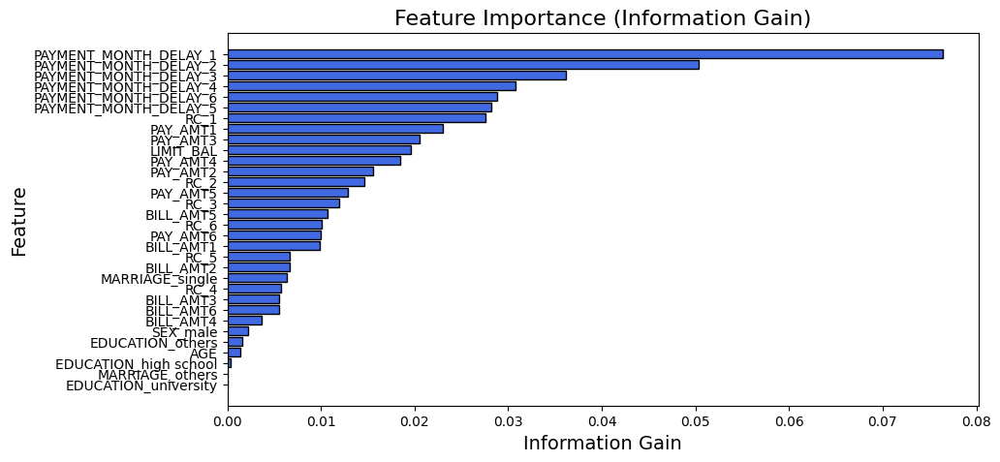

In [13]:
# Encode Target Variable
df["default_payment_next_month"] = LabelEncoder().fit_transform(df["default_payment_next_month"])

# Compute Information Gain
# Error: X and y are not defined - we need to define our feature matrix X and target variable y first
X = df.drop('default_payment_next_month', axis=1)
y = df['default_payment_next_month']
info_gain = mutual_info_classif(X, y)

# Create DataFrame for Plotting
ig_df = pd.DataFrame({'Feature': X.columns, 'Information Gain': info_gain})
ig_df = ig_df.sort_values(by="Information Gain", ascending=False)

# Plot IG
plt.figure(figsize=(10, 5))
plt.barh(ig_df["Feature"], ig_df["Information Gain"], color='royalblue', edgecolor='black')
plt.xlabel("Information Gain", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.title("Feature Importance (Information Gain)", fontsize=16)
plt.gca().invert_yaxis()  # Invert so the highest IG is at the top
plt.show()

### 3.1.7 Grid Search

Grid Search is a hyperparameter tuning technique that systematically tests multiple parameter values to find the optimal configuration for improving model performance. In this process, we define a parameter grid for the Decision Tree algorithm, specifically focusing on the max_depth parameter, which controls the depth of the tree and helps prevent overfitting. A shallow tree (low max_depth) may underfit the data, while an excessively deep tree may capture noise and overfit.

To evaluate each configuration, GridSearchCV performs cross-validation (cv=5), splitting the training data into five folds. For each depth value in the range of 1 to 15, the model is trained and evaluated across different subsets of the data. The performance metric used is accuracy, ensuring that the best depth value is selected based on its ability to maximize correct predictions. The final model is trained with the optimal max_depth, balancing complexity and generalization for improved prediction of customer defaults.

In [14]:
# Defining the parameter grid
param_grid = {'max_depth': range(1,16)} # 15 different depth levels

# Performing the Grid Search
default_tree_pruned_cv = GridSearchCV(default_tree, 
                   param_grid,
                   scoring='recall',
                   cv=5 , n_jobs=1, verbose=1)

# Fitting the Grid Search
default_tree_pruned_cv.fit(X_train,Y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(criterion='entropy',
                                              random_state=42),
             n_jobs=1, param_grid={'max_depth': range(1, 16)}, scoring='recall',
             verbose=1)

In [15]:
# Printing the best parameters and the grid scores
print("Best parameters set found on development set:", default_tree_pruned_cv.best_params_)
print("Grid scores on development set:")
means = default_tree_pruned_cv.cv_results_['mean_test_score']
stds = default_tree_pruned_cv.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, default_tree_pruned_cv.cv_results_['params']):
    print("Recall = %0.3f (+/%0.03f) for %r" % (mean, std * 2, params))

Best parameters set found on development set: {'max_depth': 11}
Grid scores on development set:
Recall = 0.335 (+/0.035) for {'max_depth': 1}
Recall = 0.316 (+/0.035) for {'max_depth': 2}
Recall = 0.379 (+/0.032) for {'max_depth': 3}
Recall = 0.375 (+/0.038) for {'max_depth': 4}
Recall = 0.369 (+/0.042) for {'max_depth': 5}
Recall = 0.372 (+/0.028) for {'max_depth': 6}
Recall = 0.354 (+/0.060) for {'max_depth': 7}
Recall = 0.364 (+/0.052) for {'max_depth': 8}
Recall = 0.371 (+/0.059) for {'max_depth': 9}
Recall = 0.358 (+/0.034) for {'max_depth': 10}
Recall = 0.379 (+/0.053) for {'max_depth': 11}
Recall = 0.359 (+/0.040) for {'max_depth': 12}
Recall = 0.364 (+/0.031) for {'max_depth': 13}
Recall = 0.372 (+/0.040) for {'max_depth': 14}
Recall = 0.374 (+/0.036) for {'max_depth': 15}


Text(0, 0.5, 'Recall')

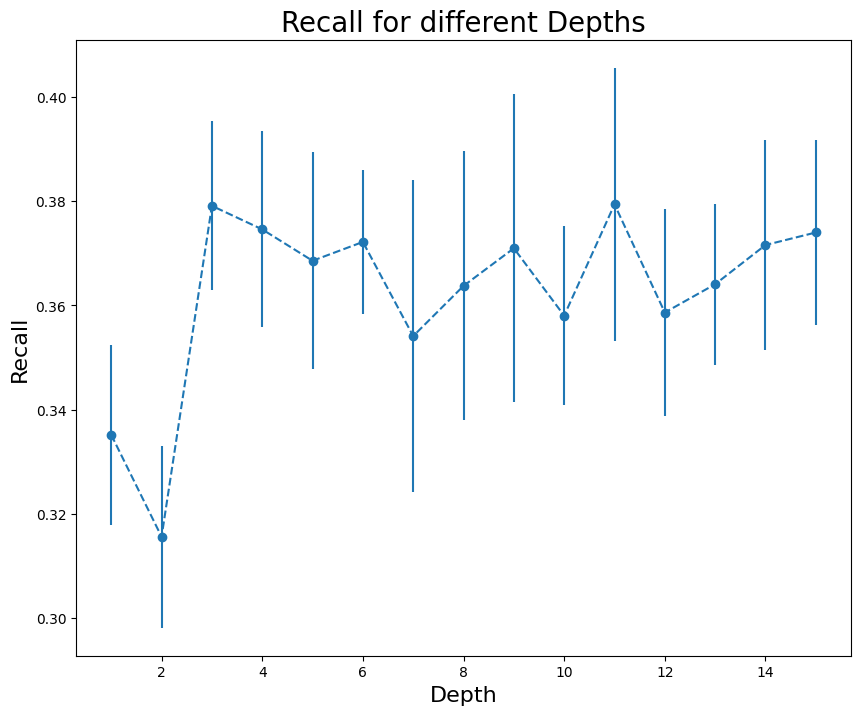

In [16]:
# Plotting the accuracy for different depths
plt.figure(figsize=(10,8))
plt.errorbar(range(1,16,1), [m for m in means], yerr=stds, fmt='--o')
plt.title('Recall for different Depths', fontsize=20)
plt.xlabel("Depth", fontsize=16)
plt.ylabel("Recall", fontsize=16)

### 3.1.8 Pruned Tree

Pruning the Decision Tree at depth = 3 is a crucial step to balance model complexity and generalization. While deeper trees can achieve higher accuracy on the training data, they tend to overfit, capturing noise and specific patterns that do not generalize well to unseen data. By limiting the tree depth, we reduce variance, making the model more stable across different datasets, but at the cost of slightly increasing bias by simplifying decision boundaries. This trade-off improves the model’s ability to make accurate predictions on new data, ensuring that it remains interpretable while maintaining strong performance in predicting customer defaults.

In [17]:
default_tree_pruned = DecisionTreeClassifier(random_state=42, max_depth=3) 
tree=default_tree_pruned.fit(X_train, Y_train)

predictions_test = default_tree_pruned.predict(X_test) # obtains predictions with a threshold=50%

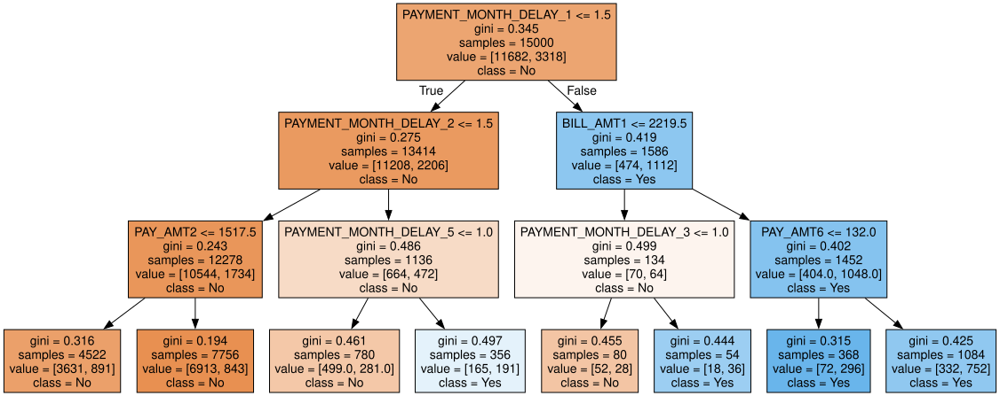

In [18]:

# Plotting the Pruned Tree
from sklearn import tree
dot_data = tree.export_graphviz(default_tree_pruned, out_file=None, 
                                class_names=["No","Yes"],
                                feature_names=X_train.columns,  
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

### 3.1.9 Confusion Matrix

Text(50.722222222222214, 0.5, 'Predicted Values')

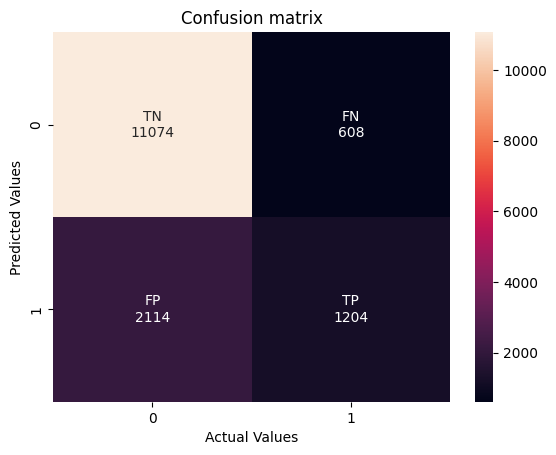

In [19]:
# Confusion Matrix
conf_mat = confusion_matrix(Y_test, predictions_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

### 3.1.10 Precision and Recall Trade-Off

In our business case, recall is more important than accuracy when predicting credit card customer defaults. While accuracy measures the overall correctness of the model, it does not differentiate between false negatives and false positives, which is critical in our scenario. A model with high accuracy may still fail to detect a significant number of actual defaulters, which poses a major financial risk to the institution.

By prioritizing recall, we ensure that the model correctly identifies as many actual defaulters as possible, even if it means occasionally misclassifying some non-defaulters. Missing a true defaulter (false negative) can result in substantial financial losses, as these customers may continue to accumulate debt they cannot repay. In contrast, a false positive (incorrectly labeling a non-defaulter as a defaulter) while not ideal, is less damaging than failing to detect a high-risk borrower.

Although increasing recall may slightly reduce precision (leading to some customers being unnecessarily flagged as high-risk), it strengthens risk management by ensuring that defaulting customers are effectively identified. The trade-off favors minimizing the cost of undetected defaulters over minimizing the inconvenience to non-defaulters, as the financial consequences of missing a default are significantly higher than those of mistakenly restricting credit for a few reliable customers

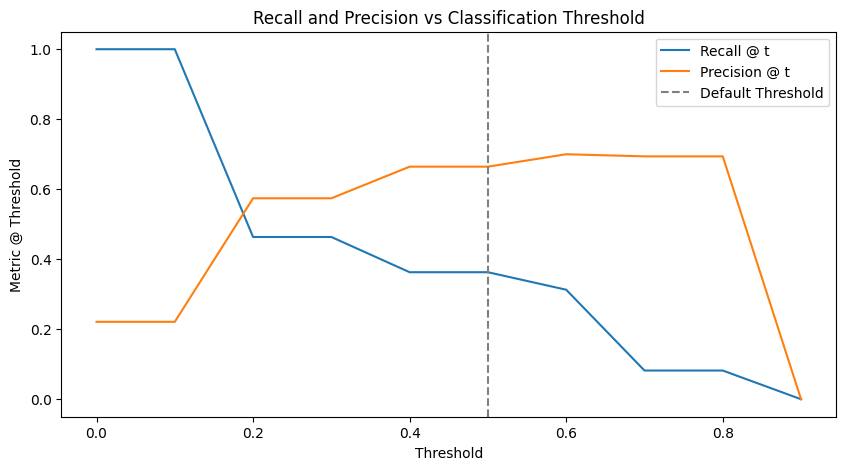

In [20]:
# Get probability predictions
prob_pred = default_tree_pruned.predict_proba(X_test)[:, 1]

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()


### 3.1.11 ROC Curve

The ROC curve is a crucial tool for evaluating the performance of classification models, as it visually represents the trade-off between True Positive Rate (Recall) and False Positive Rate at different classification thresholds. Unlike accuracy, which does not account for the imbalance between defaulters and non-defaulters, the ROC curve provides a more comprehensive assessment of how well the model distinguishes between the two classes across various decision boundaries.

The AUC (Area Under the Curve) is an important metric derived from the ROC curve, indicating the model’s overall ability to discriminate between defaulters and non-defaulters. A higher AUC (closer to 1) suggests that the model effectively separates the two classes, while an AUC near 0.5 implies random guessing.

Since our priority is Recall over Accuracy, the ROC curve helps in selecting an optimal threshold that maximizes the detection of actual defaulters, even if it means accepting a higher false positive rate. Missing a true defaulter (false negative) has far greater financial consequences than incorrectly flagging a non-defaulter. Thus, by leveraging the ROC curve and AUC, we can adjust the decision boundary to ensure maximum risk mitigation, making it a critical tool for validating and fine-tuning our classification model

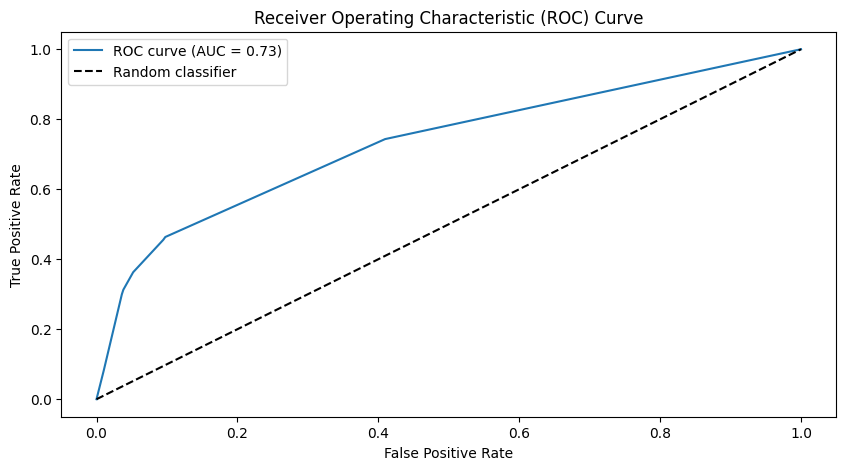

In [21]:
# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, prob_pred)
m1_auc = metrics.auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {m1_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


### 3.1.12 Model #1: Performance

In [22]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, predictions_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate recall, accuracy, and specificity
m1_recall = TP / (TP + FN)
m1_accuracy = (TP + TN) / (TP + TN + FP + FN)
m1_precision = TP / (TP + FP)
m1_specificity = TN / (TN + FP)

print(f"Recall: {m1_recall:.2f}")
print(f"Accuracy: {m1_accuracy:.2f}")
print(f"Precision: {m1_precision:.2f}")
print(f"Specificity: {m1_specificity:.2f}")
print(f"AUC: {m1_auc:.2f}")

Recall: 0.36
Accuracy: 0.82
Precision: 0.66
Specificity: 0.95
AUC: 0.73


***
To improve the recall of our models while maintaining an acceptable precision, we adjusted the classification threshold for each model. The default threshold of 0.5 in most classifiers may not be optimal for detecting credit card customer defaults, as it balances precision and recall equally. However, in our business case, identifying defaulters correctly (recall) is crucial to minimize financial risk.

By lowering the threshold, we increase the sensitivity of the model, meaning more potential defaulters are correctly classified. This helps reduce false negatives, ensuring fewer high-risk customers are incorrectly labeled as non-defaulters. However, lowering the threshold too much can significantly decrease precision, leading to more false positives, which could result in unnecessary restrictions on reliable customers.

To mitigate this trade-off, we carefully tuned the threshold for each model to achieve a better recall while keeping precision at an acceptable level. This balance ensures that we effectively detect defaulters without excessively misclassifying non-defaulters, optimizing the model's business impact.
***

### 3.1.13 Model #1: Overall Performance reducing the threshold (0.3)

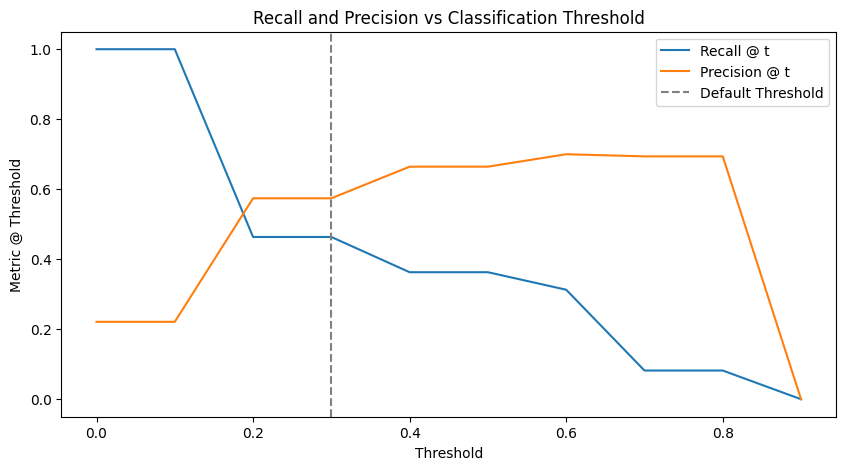

Recall: 0.46
Accuracy: 0.81
Precision: 0.57
Specificity: 0.90
AUC: 0.68


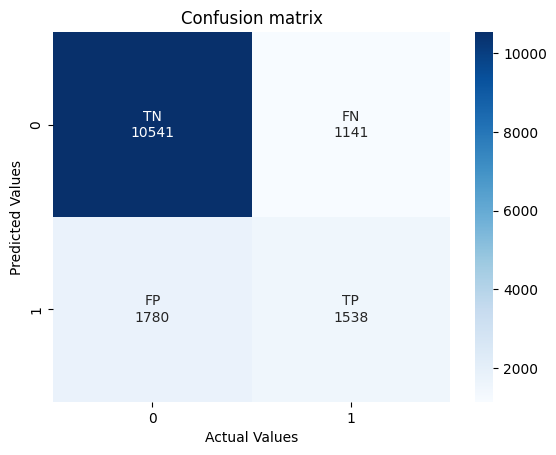

In [23]:
# Get probability predictions
prob_pred = default_tree_pruned.predict_proba(X_test)[:, 1]

threshold = 0.3
y_pred_test = (prob_pred > threshold).astype(int) 

#----------------------------------------------------------

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.3, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

#--------------------------------------------------------

# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='Blues')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

#---------------------------------------------------------------- 

# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred_test)
m1_auc_rt = metrics.auc(fpr, tpr)

### ------------------------------------------------------------

# Calculate recall, accuracy, and specificity
m1_recall_rt = TP / (TP + FN)
m1_accuracy_rt = (TP + TN) / (TP + TN + FP + FN)
m1_precision_rt = TP / (TP + FP)
m1_specificity_rt = TN / (TN + FP)

print(f"Recall: {m1_recall_rt:.2f}")
print(f"Accuracy: {m1_accuracy_rt:.2f}")
print(f"Precision: {m1_precision_rt:.2f}")
print(f"Specificity: {m1_specificity_rt:.2f}")
print(f"AUC: {m1_auc_rt:.2f}")


## 3.2. Model #2: Bagging

The Bagging (Bootstrap Aggregating) algorithm is an ensemble learning method that improves the stability and accuracy of classification models by reducing variance through multiple iterations of training. Bagging is particularly effective in mitigating overfitting, a common issue in decision trees, by training multiple models on different subsets of the data and averaging their predictions.

The core principle of Bagging is bootstrapping, where multiple random samples are drawn with replacement from the training data. Each sample is used to train an independent base model (typically Decision Trees) which tend to be high-variance learners. By averaging the predictions of these multiple trees (or taking the majority vote in classification tasks), Bagging smooths out individual model errors, leading to a more robust and generalized classifier.

In our case, implementing Bagging helps stabilize decision tree predictions and enhance model generalization when predicting credit card customer defaults. The diversity introduced by bootstrapping prevents the ensemble from being overly sensitive to small changes in the data, making it particularly effective in reducing variance without significantly increasing bias. The final model is evaluated using classification metrics to ensure that it improves upon a single Decision Tree by offering higher precision and overall predictive performance.

### 3.2.1 Selecting the train and test data sets

In [24]:
# Creating the function to split the data into train and test sets

def split_df(dataframe, seed=None, percentage=0.8):
    
    X = df.loc[:, dataframe.columns != 'default_payment_next_month']
    y = df['default_payment_next_month']

    return train_test_split(X, y, test_size=1-percentage, random_state=seed)

# Running the function to split the data into train and test sets

X_train, X_test, Y_train, Y_test = split_df(df, seed=42, percentage=0.5)

print("Train: ", X_train.shape)
print("Test: ", X_test.shape)

Train:  (15000, 32)
Test:  (15000, 32)


### 3.2.2 Model (OOB Score)

The given code implements a Random Forest Classifier using Bagging, with a key focus on the Out-of-Bag (OOB) score, an important concept in ensemble learning.

In Bagging, each tree in the Random Forest is trained on a bootstrapped sample (a random subset of the data with replacement), meaning that approximately two-thirds of the original dataset is used for training each tree. The remaining one-third of the data, known as Out-of-Bag (OOB) observations, is left out and serves as a built-in validation set for evaluating model performance.

OOB score estimates the generalization error of the model without needing a separate validation set. The key advantage of OOB evaluation is that it provides a performance estimate similar to cross-validation without additional computational cost. The final OOB score is obtained by averaging the OOB error across all trees, offering a robust and unbiased assessment of model accuracy.
This approach ensures that the model is neither overfitting nor underfitting, making it an essential validation technique in ensemble learning.

In [25]:
baseRF = RandomForestClassifier(n_estimators = 200,  # The number of trees in the forest
                               random_state = 0, # This parameter allows to replicate results
                               n_jobs = -1, # The number of jobs to run in parallel (-1 means all processors, 1 no parallelism)
                               oob_score = True) # Whether to use out-of-bag samples to estimate the generalization score (increases time)

# The OOB score is an estimate of the generalization error of the model, calculated with the data not used to train it.
# Since each tree is trained on a bootstrapped sample, they all use approximately 2/3 of the data (this is a mathematical consequence 
# of random sampling with replacement). Therefore, for each of the learners we have 1/3 of the dataset as Out Of Bag (OOB) observations 
# which can be used to test the model and estimate its generalisation error. By averaging these OOB error estimates across the trees, 
# RF produces a robust error estimate for the ensemble during training time at almost no additional computational cost.

# other parameters:
# criterion{"gini", "entropy", "log_loss"}, default="gini"
# max_depth: int, default=None
# min_samples_leaf: int or float, default=1 - The minimum number of samples required to be at a leaf node
# min_samples_split: int or float, default=2 - The minimum number of samples required to split an internal node:
# max_features{"sqrt", "log2", None}, int or float, default="sqrt" - The number of features to consider when looking for the best split

baseRF.fit(X_train,Y_train)

# predictions
y_pred_test = baseRF.predict(X_train)

print("OOB score: {:.2%}".format(baseRF.oob_score_))

OOB score: 81.31%


### 3.2.3 Grid Search

To optimize the Bagging model using Random Forest, we apply Grid Search to systematically explore different combinations of hyperparameters. This process ensures that we select the configuration that maximizes model performance while maintaining generalization.

In this tuning process, we focus on three key hyperparameters:

min_samples_leaf: This controls the minimum number of samples required to be present in a leaf node. Higher values help prevent overfitting by ensuring that the tree does not create overly small leaf nodes, improving model generalization.
max_features: This defines the number of features randomly selected at each split. A lower value introduces more randomness, increasing diversity among trees, while a higher value allows trees to make more precise splits.
criterion: Determines how the tree evaluates splits, with Gini Impurity and Entropy being the two available methods. Gini tends to be computationally faster, while Entropy may provide slightly better performance for some datasets.

By performing Grid Search, we systematically test different hyperparameter combinations and identify the best-performing configuration, balancing model complexity and predictive recall for customer default classification.


In [26]:
# Parameters for the grid search
param_grid = {
    'min_samples_leaf' :[3,5,7], 
    'max_features' : [10,20,30,40],
    'criterion' : ['gini','entropy']
}

In [27]:
cvRF = GridSearchCV(estimator=baseRF, param_grid=param_grid, cv=5, scoring='recall') 
#cv is the number of cross validation iterations to be performed
cvRF.fit(X_train,Y_train)

best_params = cvRF.best_params_
print("Best parameters:", best_params)

Best parameters: {'criterion': 'gini', 'max_features': 40, 'min_samples_leaf': 3}


### 3.2.4 Model after Grid Search

In [28]:
baseRF = RandomForestClassifier(n_estimators = 200,  # The number of trees in the forest
                               random_state = 0, # This parameter allows to replicate results
                               n_jobs = -1, # The number of jobs to run in parallel (-1 means all processors, 1 no parallelism)
                               oob_score = True,
                               criterion='gini',
                               min_samples_leaf=3,
                               max_features=40) # Whether to use out-of-bag samples to estimate the generalization score (increases time)

# The OOB score is an estimate of the generalization error of the model, calculated with the data not used to train it.
# Since each tree is trained on a bootstrapped sample, they all use approximately 2/3 of the data (this is a mathematical consequence 
# of random sampling with replacement). Therefore, for each of the learners we have 1/3 of the dataset as Out Of Bag (OOB) observations 
# which can be used to test the model and estimate its generalisation error. By averaging these OOB error estimates across the trees, 
# RF produces a robust error estimate for the ensemble during training time at almost no additional computational cost.

# other parameters:
# criterion{"gini", "entropy", "log_loss"}, default="gini"
# max_depth: int, default=None
# min_samples_leaf: int or float, default=1 - The minimum number of samples required to be at a leaf node
# min_samples_split: int or float, default=2 - The minimum number of samples required to split an internal node:
# max_features{"sqrt", "log2", None}, int or float, default="sqrt" - The number of features to consider when looking for the best split

baseRF.fit(X_train,Y_train)

# predictions
y_pred_test = baseRF.predict(X_train)

print("OOB score: {:.2%}".format(baseRF.oob_score_))

OOB score: 81.30%


### 3.2.5 Confusion Matrix

Text(0.5, 23.52222222222222, 'Actual Values')

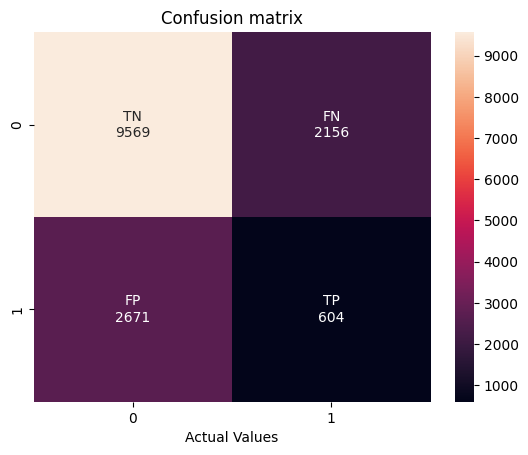

In [29]:
# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
# ax.set_ylabel('Predicted Values')

### 3.2.6 Precision and Recall

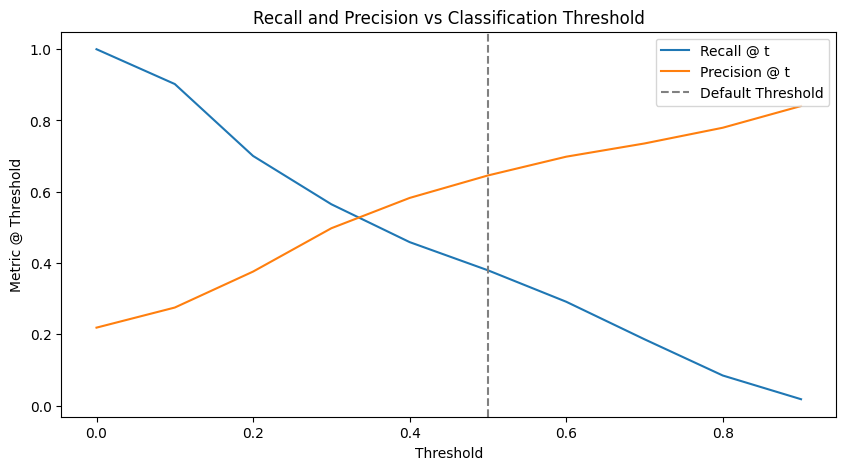

In [30]:
# Get probability predictions
prob_pred = baseRF.predict_proba(X_test)[:, 1]

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

### 3.2.7 ROC Curve

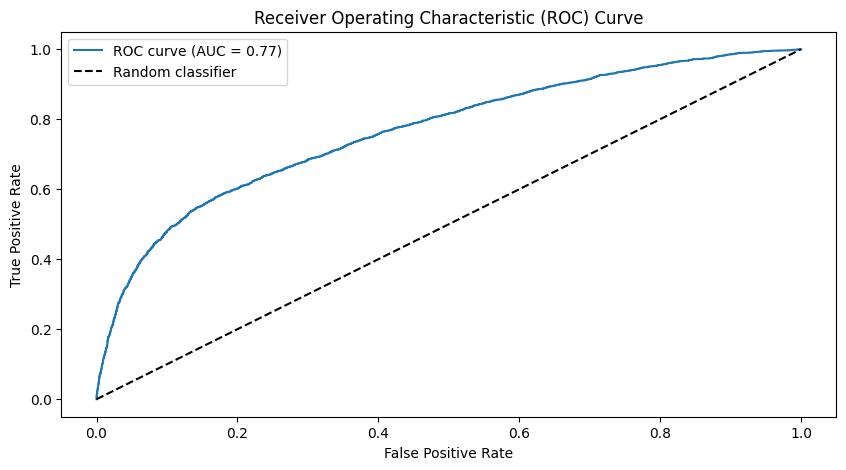

In [31]:
# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, prob_pred)
m2_auc = metrics.auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {m2_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### 3.2.8 Model #2: Performance

In [32]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate recall, accuracy, and specificity
m2_recall = TP / (TP + FN)
m2_accuracy = (TP + TN) / (TP + TN + FP + FN)
m2_precision = TP / (TP + FP)
m2_specificity = TN / (TN + FP)
m2_OOB_Score = baseRF.oob_score_

print(f"Recall: {m2_recall:.2f}")
print(f"Accuracy: {m2_accuracy:.2f}")
print(f"Precision: {m2_precision:.2f}")
print(f"Specificity: {m2_specificity:.2f}")
print(f"OOB Score: {m2_OOB_Score:.2f}")
print(f"AUC: {m2_auc:.2f}")

Recall: 0.18
Accuracy: 0.68
Precision: 0.22
Specificity: 0.82
OOB Score: 0.81
AUC: 0.77


### 3.2.9 Model #2: Overall Performance reducing the threshold (0.3)

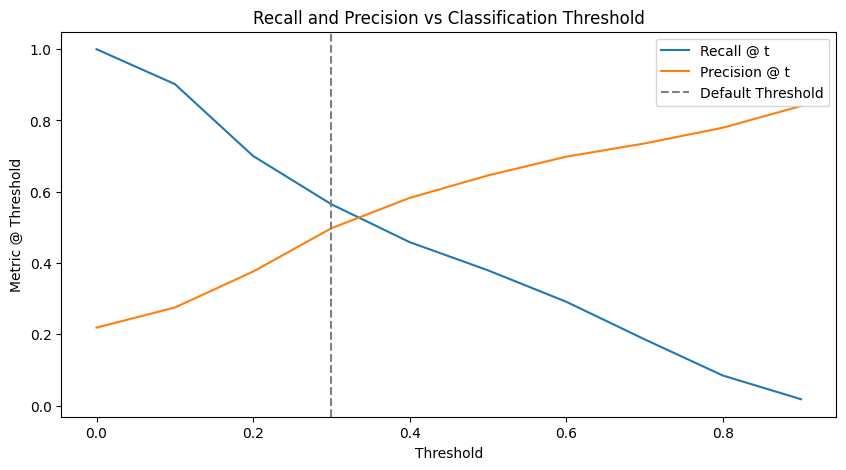

Recall: 0.56
Accuracy: 0.78
Precision: 0.50
Specificity: 0.84
AUC: 0.70


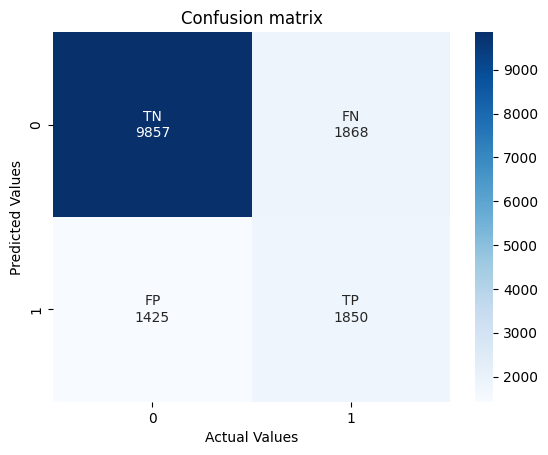

In [33]:
# Get probability predictions
prob_pred = baseRF.predict_proba(X_test)[:, 1]

threshold = 0.3
y_pred_test = (prob_pred > threshold).astype(int) 

#----------------------------------------------------------

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.3, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

#--------------------------------------------------------

# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='Blues')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

#---------------------------------------------------------------- 

# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred_test)
m2_auc_rt = metrics.auc(fpr, tpr)

### ------------------------------------------------------------

# Calculate recall, accuracy, and specificity
m2_recall_rt = TP / (TP + FN)
m2_accuracy_rt = (TP + TN) / (TP + TN + FP + FN)
m2_precision_rt = TP / (TP + FP)
m2_specificity_rt = TN / (TN + FP)

print(f"Recall: {m2_recall_rt:.2f}")
print(f"Accuracy: {m2_accuracy_rt:.2f}")
print(f"Precision: {m2_precision_rt:.2f}")
print(f"Specificity: {m2_specificity_rt:.2f}")
print(f"AUC: {m2_auc_rt:.2f}")

## 3.3 Model #3: Random Forest

The Random Forest algorithm is an extension of Bagging, leveraging multiple decision trees to improve classification performance while reducing overfitting. Like Bagging, Random Forest employs bootstrapping, where each tree is trained on a random subset of the data. However, the key difference lies in feature selection: while Bagging allows each tree to consider all features at each split, Random Forest introduces additional randomness by selecting a random subset of features at each node, reducing correlation between trees and improving generalization.

This additional randomness makes Random Forest more robust than standard Bagging, as it prevents individual trees from relying too heavily on dominant features, leading to a more balanced model. Additionally, Random Forest provides feature importance scores, allowing us to interpret which variables contribute most to predictions.

By combining multiple uncorrelated trees and averaging their outputs, Random Forest achieves lower variance than single Decision Trees, while maintaining high predictive power. This makes it a highly effective method for predicting credit card customer defaults, balancing precision and recall while improving overall model stability.

### 3.3.1 Selecting the train and test data sets

We will use the same datasets as Bagging algorithm

### 3.3.2 Model

In [34]:
# Random Forest
model_RF = RandomForestClassifier(n_estimators = 200, 
                               random_state = 0,
                               max_features = 15, #this parameter makes the difference between simple Bagging and Random Forests
                               n_jobs = -1,
                               oob_score = True,
                               criterion = 'entropy',
                               min_samples_leaf = 3)
model_RF.fit(X_train,Y_train)

# predictions
y_pred_test = model_RF.predict(X_test)

print("OOB score: {:.2%}".format(model_RF.oob_score_))

OOB score: 81.32%


### 3.3.3 Grid Search

To optimize the Random Forest model, we perform Grid Search on the number of trees (n_estimators) ranging from 10 to 200. For each iteration, the model is trained with max_features = 15 (half of the total variables), and its performance is evaluated using test set accuracy and 5-fold cross-validation scores. The test accuracy measures how well the model generalizes, while cross-validation ensures robustness across different data splits. Increasing the number of trees typically improves stability by reducing variance, but beyond a certain point, gains become minimal while computational cost increases. The optimal n_estimators is selected based on the highest cross-validation accuracy, ensuring a well-balanced model for predicting customer defaults.

In [35]:
# Iteration for accuracy scores for different quantity of trees

train_scores = []
cv_scores    = []

estimator_range = range(10, 210, 10) #from 10 trees to 200, step 10

for n_estimators in estimator_range:
    model_RF = RandomForestClassifier(
                n_estimators = n_estimators,
                max_features = 15,
                oob_score    = False,
                n_jobs       = -1, 
                random_state = 0
             )
    
    model_RF.fit(X_train, Y_train)
    predictions = model_RF.predict(X_test)
    acc=recall_score(Y_test, predictions)
    print("% Recall of test dataset for {} trees is {:.3f}".format(n_estimators, acc))
    train_scores.append(acc) # storing accuracy from each iteration

    # and we also store the recall mean obtained from running a 5-fold validation
    cvscores = cross_val_score(
                estimator = model_RF,
                X         = X_train,
                y         = Y_train,
                scoring   = 'recall',
                cv        = 5
             )
    cv_scores.append(cvscores.mean()) 

% Recall of test dataset for 10 trees is 0.333
% Recall of test dataset for 20 trees is 0.361
% Recall of test dataset for 30 trees is 0.363
% Recall of test dataset for 40 trees is 0.366
% Recall of test dataset for 50 trees is 0.369
% Recall of test dataset for 60 trees is 0.368
% Recall of test dataset for 70 trees is 0.369
% Recall of test dataset for 80 trees is 0.371
% Recall of test dataset for 90 trees is 0.375
% Recall of test dataset for 100 trees is 0.375
% Recall of test dataset for 110 trees is 0.376
% Recall of test dataset for 120 trees is 0.374
% Recall of test dataset for 130 trees is 0.376
% Recall of test dataset for 140 trees is 0.375
% Recall of test dataset for 150 trees is 0.376
% Recall of test dataset for 160 trees is 0.375
% Recall of test dataset for 170 trees is 0.376
% Recall of test dataset for 180 trees is 0.377
% Recall of test dataset for 190 trees is 0.375
% Recall of test dataset for 200 trees is 0.376


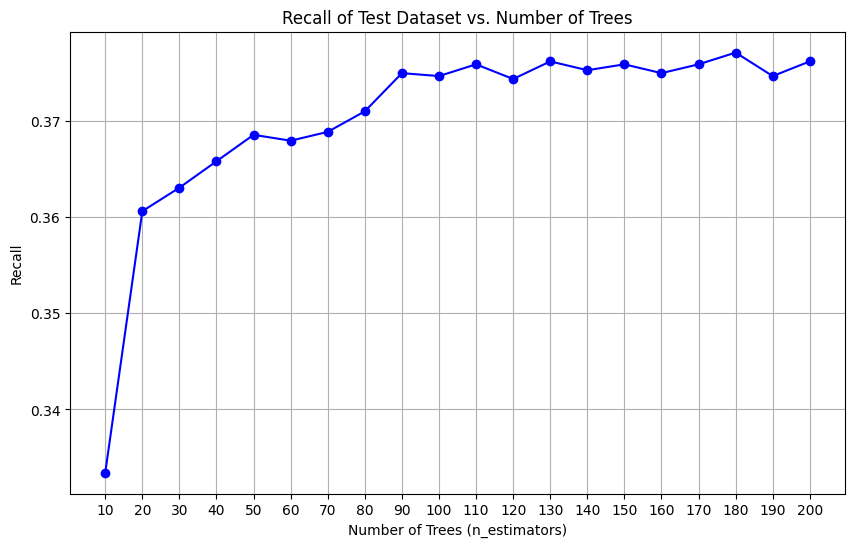

In [36]:
# Plot of the accuracy depending on the number of trees

plt.figure(figsize=(10, 6))
plt.plot(estimator_range, train_scores, marker='o', linestyle='-', color='b')
plt.title('Recall of Test Dataset vs. Number of Trees')
plt.xlabel('Number of Trees (n_estimators)')
plt.ylabel('Recall')
plt.xticks(estimator_range)
plt.grid()
plt.show()

Optimum number of trees: 120


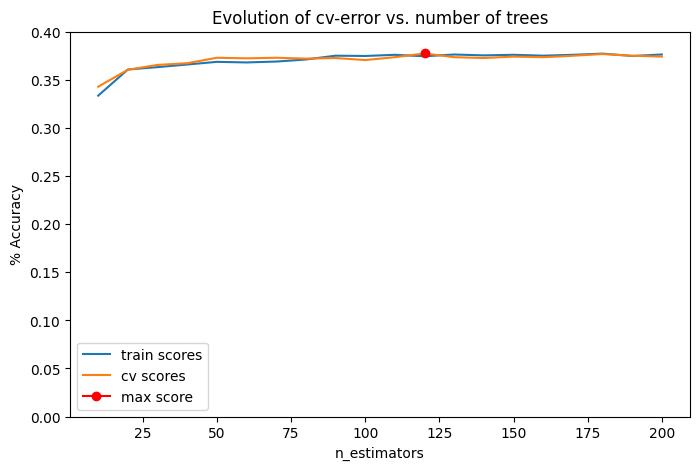

In [37]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(estimator_range, train_scores, label="train scores")
ax.plot(estimator_range, cv_scores, label="cv scores")
ax.plot(estimator_range[np.argmax(cv_scores)], max(cv_scores),
        marker='o', color = "red", label="max score")
ax.set_ylim(0, 0.4)
ax.set_ylabel("% Accuracy")
ax.set_xlabel("n_estimators")
ax.set_title("Evolution of cv-error vs. number of trees")
plt.legend();
print(f"Optimum number of trees: {estimator_range[np.argmax(cv_scores)]}")

### 3.3.4 Model after Grid Search

We will use a total of 80 trees since the accuracy of the model doesn't improve with more trees

In [38]:
# Random Forest
model_RF = RandomForestClassifier(n_estimators = 180, 
                               random_state = 0,
                               max_features = 15, #this parameter makes the difference between simple Bagging and Random Forests
                               n_jobs = -1,
                               oob_score = True,
                               criterion = 'entropy',
                               min_samples_leaf = 3)
model_RF.fit(X_train,Y_train)

# predictions
y_pred_test = model_RF.predict(X_test)

print("OOB score: {:.2%}".format(model_RF.oob_score_))

OOB score: 81.21%


### 3.3.5 Confusion Matrix

Text(0.5, 23.52222222222222, 'Actual Values')

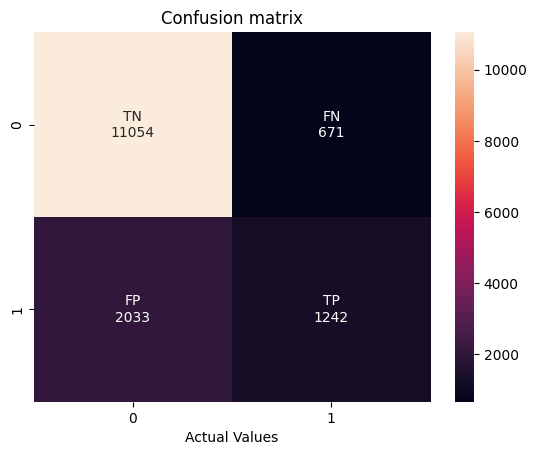

In [39]:
# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
# ax.set_ylabel('Predicted Values')

### 3.3.6 Precision and Recall

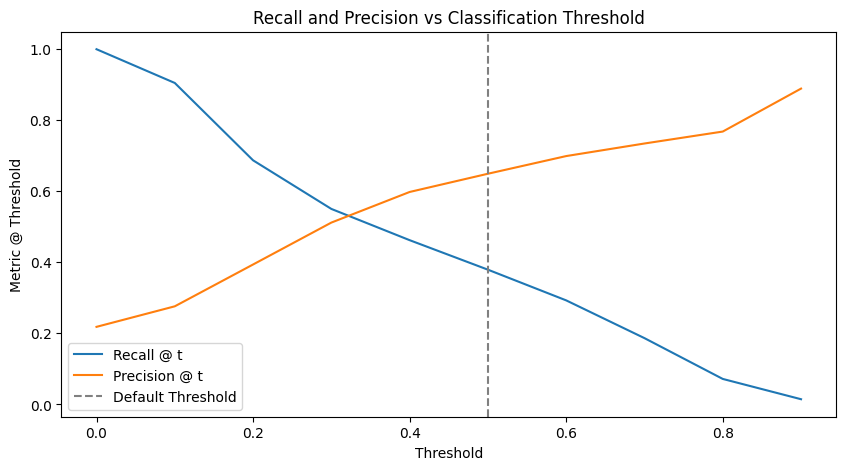

In [40]:
# Get probability predictions
prob_pred = model_RF.predict_proba(X_test)[:, 1]

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

### 3.3.7 ROC Curve

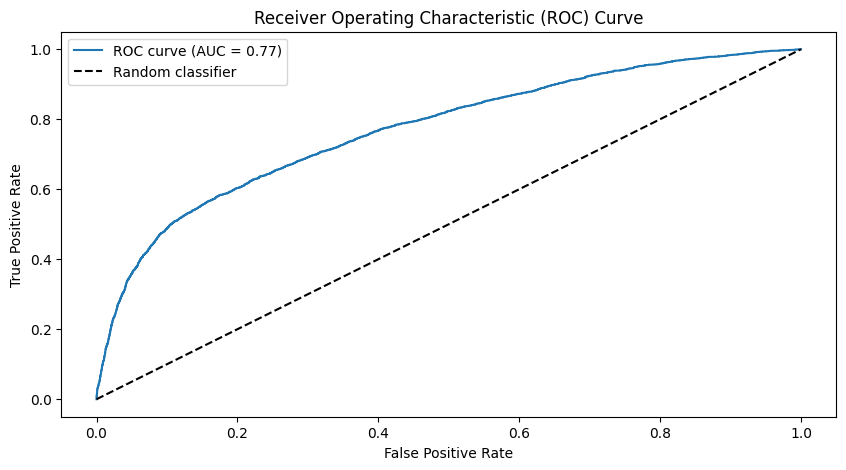

In [41]:
# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, prob_pred)
m3_auc = metrics.auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {m3_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### 3.3.8 Model #3: Performance

In [42]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate recall, accuracy, and specificity
m3_recall = TP / (TP + FN)
m3_accuracy = (TP + TN) / (TP + TN + FP + FN)
m3_precision = TP / (TP + FP)
m3_specificity = TN / (TN + FP)
m3_OOB_Score = baseRF.oob_score_

print(f"Recall: {m3_recall:.2f}")
print(f"Accuracy: {m3_accuracy:.2f}")
print(f"Precision: {m3_precision:.2f}")
print(f"Specificity: {m3_specificity:.2f}")
print(f"OOB Score: {m3_OOB_Score:.2f}")
print(f"AUC: {m3_auc:.2f}")

Recall: 0.38
Accuracy: 0.82
Precision: 0.65
Specificity: 0.94
OOB Score: 0.81
AUC: 0.77


### 3.3.9 Model #3: Overall Performance reducing the threshold (0.3)

Recall: 0.55
Accuracy: 0.79
Precision: 0.51
Specificity: 0.85
AUC: 0.70


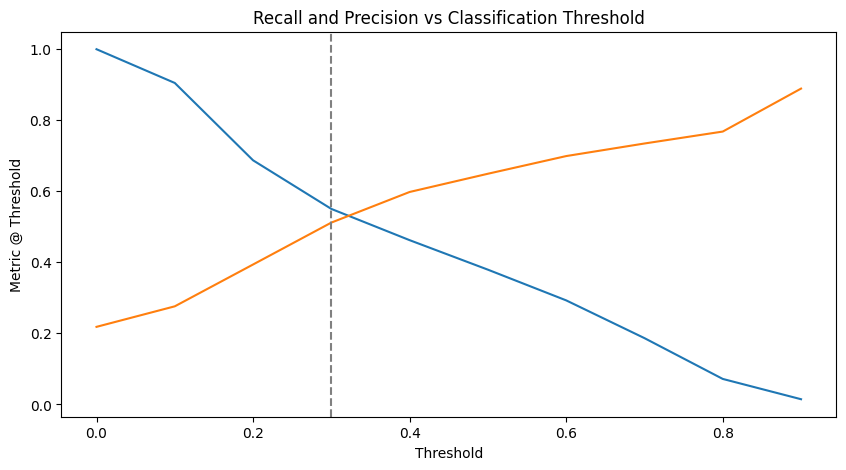

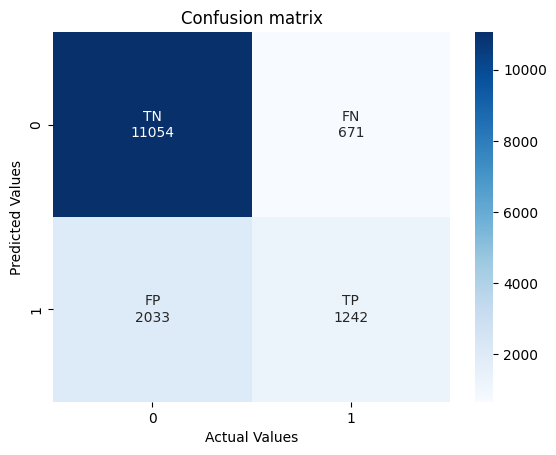

In [43]:
# Get probability predictions
prob_pred = model_RF.predict_proba(X_test)[:, 1]

threshold = 0.3
y_pred_test = (prob_pred > threshold).astype(int) 

#----------------------------------------------------------

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(threshold, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")

# Calculate recall, accuracy, and specificity
m3_recall = TP / (TP + FN)
m3_accuracy = (TP + TN) / (TP + TN + FP + FN)
m3_precision = TP / (TP + FP)
m3_specificity = TN / (TN + FP)
m3_OOB_Score = baseRF.oob_score_

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='Blues')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

#---------------------------------------------------------------- 

# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred_test)
m3_auc_rt = metrics.auc(fpr, tpr)

### ------------------------------------------------------------

# Calculate recall, accuracy, and specificity
m3_recall_rt = TP / (TP + FN)
m3_accuracy_rt = (TP + TN) / (TP + TN + FP + FN)
m3_precision_rt = TP / (TP + FP)
m3_specificity_rt = TN / (TN + FP)

print(f"Recall: {m3_recall_rt:.2f}")
print(f"Accuracy: {m3_accuracy_rt:.2f}")
print(f"Precision: {m3_precision_rt:.2f}")
print(f"Specificity: {m3_specificity_rt:.2f}")
print(f"AUC: {m3_auc_rt:.2f}")

## 3.4 Model #4: Boosting

The Boosting algorithm is an ensemble learning technique that improves model performance by sequentially training weak learners, typically Decision Trees, and adjusting their weights to correct previous errors. Unlike Bagging and Random Forest, which build trees independently and aggregate their predictions, Boosting trains models sequentially, with each new tree focusing on correcting the mistakes made by the previous ones. This iterative process helps Boosting create a stronger predictive model with reduced bias.

A key difference from Random Forest is that Boosting assigns higher weights to misclassified instances, ensuring that each subsequent tree prioritizes difficult cases—particularly those more likely to default. This makes Boosting well-suited for our objective, as it helps increase Recall, ensuring that the model captures as many actual defaulters as possible. While this approach reduces bias and increases predictive power, it comes at the cost of higher variance and computational complexity. Unlike Bagging, which reduces variance by training trees in parallel, Boosting gradually optimizes both bias and variance, refining model performance over multiple iterations.

Boosting is particularly effective in handling imbalanced datasets, such as credit default prediction, where recall is more critical than overall accuracy. Since missing a true defaulter (false negative) can lead to significant financial risks, Boosting's ability to focus on hard-to-classify cases makes it a powerful choice. However, careful hyperparameter tuning is essential to prevent overfitting, as Boosting tends to create models that fit training data very closely. The final model is obtained by combining the weighted outputs of all weak learners, making Boosting a highly effective approach for maximizing Recall in credit risk assessment

### 3.4.1 Selecting the train and test data sets

We will use the same datasets as previous algorithms

### 3.4.2 Model

In [44]:
# Initialize XGBoost Classifier with logloss instead of entropy
xgb_clf = XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False, random_state=42, n_jobs=-1)


### 3.4.3 Grid Search

For Boosting we will focus our grid on the shrinkage. Which is controlled by the learning rate, is crucial for improving model generalization and reducing overfitting. Shrinkage works by scaling down the contribution of each weak learner (tree) to the final prediction, ensuring that the model learns gradually rather than making aggressive updates. A lower learning rate (e.g., 0.01) forces the model to take smaller steps, requiring more boosting iterations (n_estimators) but leading to a more stable and generalized model. Conversely, a higher learning rate (e.g., 0.2) allows faster convergence but increases the risk of overfitting. Properly tuning shrinkage is essential in Boosting to balance bias and variance, ensuring the model learns effectively without fitting too closely to the training data

In [45]:
# Define hyperparameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of boosting rounds
    'max_depth': [3, 6, 10],  # Depth of trees
    'learning_rate': [0.01, 0.1, 0.2],  # Step size shrinkage
    'subsample': [0.7, 0.8, 1.0],  # Fraction of data used per tree
    'colsample_bytree': [0.7, 0.8, 1.0]  # Fraction of features used per tree
}

# Use RandomizedSearchCV for tuning (prioritizing precision)
grid_search = RandomizedSearchCV(
    xgb_clf, param_grid, scoring='recall', cv=3, n_iter=10, n_jobs=-1, random_state=42
)

# Fit RandomizedSearchCV to training data
grid_search.fit(X_train, Y_train)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=-1,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 6, 10],
                                        'n_estimators': [50, 100, 200],
                                        'subsample': [0.7, 0.8, 1.0]},
                   random_state=42, scoring='recall')

### 3.4.4 Model after Grid Search

In [46]:
# Get the best parameters
best_params = grid_search.best_params_
print(f"Best parameters for precision: {best_params}")

Best parameters for precision: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 10, 'learning_rate': 0.2, 'colsample_bytree': 1.0}


In [47]:
# Train final XGBoost model with best parameters
final_xgb = XGBClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    learning_rate=best_params['learning_rate'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    objective='binary:logistic',
    eval_metric='logloss',
    use_label_encoder=False,
    random_state=42,
    n_jobs=-1
)

final_xgb.fit(X_train, Y_train)

# Predictions
y_pred = final_xgb.predict(X_test)

### 3.4.5 Confusion Matrix

Text(50.722222222222214, 0.5, 'Predicted Values')

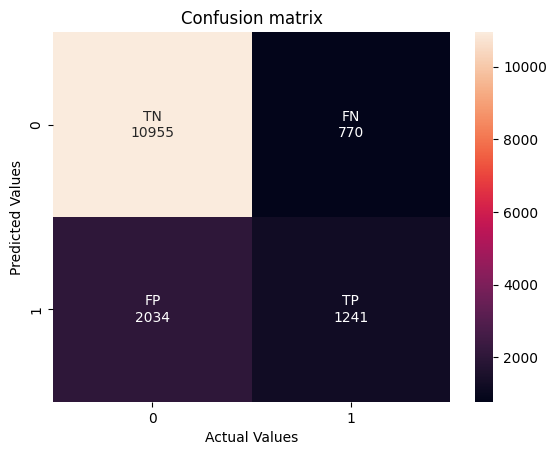

In [48]:
# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

### 3.4.6 Precision and Recall

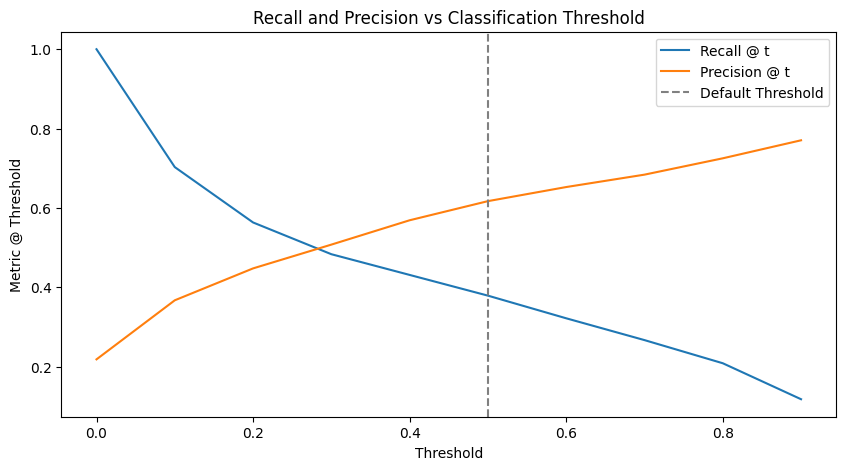

In [49]:
# Get probability predictions
prob_pred = final_xgb.predict_proba(X_test)[:, 1]

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

### 3.3.7 ROC Curve

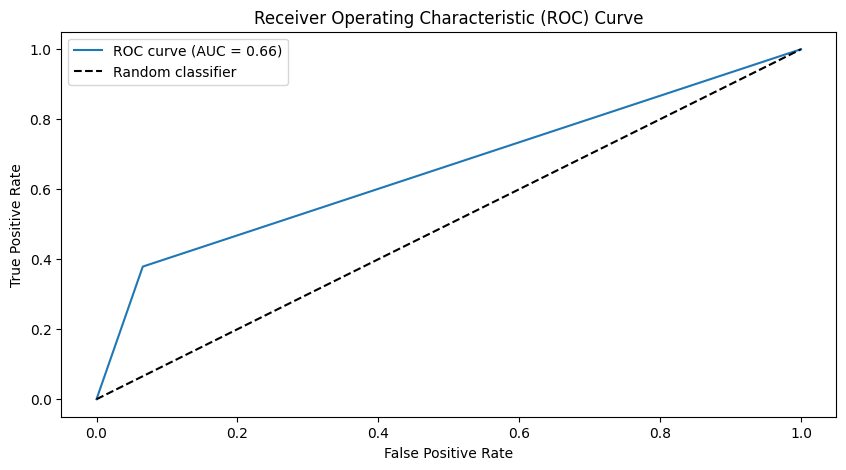

In [50]:
# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred)
m4_auc = metrics.auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {m4_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### 3.4.8 Model #4: Performance

In [51]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred_test)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate recall, accuracy, and specificity
m4_recall = TP / (TP + FN)
m4_accuracy = (TP + TN) / (TP + TN + FP + FN)
m4_precision = TP / (TP + FP)
m4_specificity = TN / (TN + FP)

print(f"Recall: {m4_recall:.2f}")
print(f"Accuracy: {m4_accuracy:.2f}")
print(f"Precision: {m4_precision:.2f}")
print(f"Specificity: {m4_specificity:.2f}")
print(f"AUC: {m4_auc:.2f}")

Recall: 0.55
Accuracy: 0.79
Precision: 0.51
Specificity: 0.85
AUC: 0.66


### 3.4.9 Model #4: Overall Performance reducing the threshold (0.3)

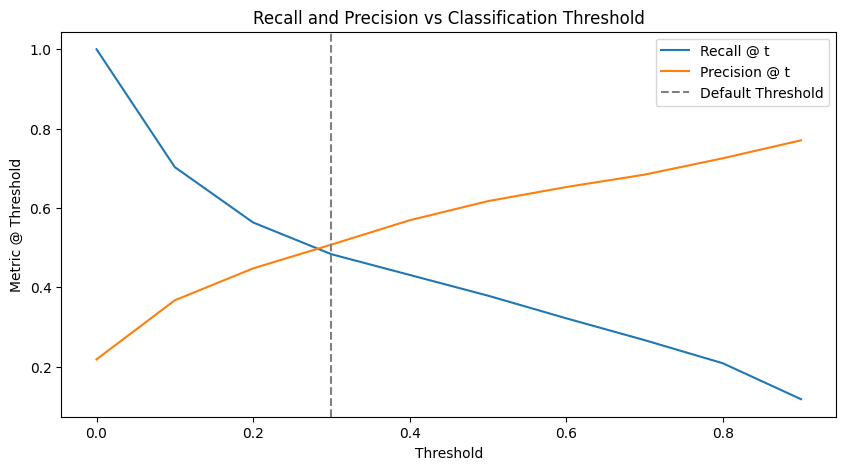

Recall: 0.55
Accuracy: 0.79
Precision: 0.51
Specificity: 0.85
AUC: 0.68


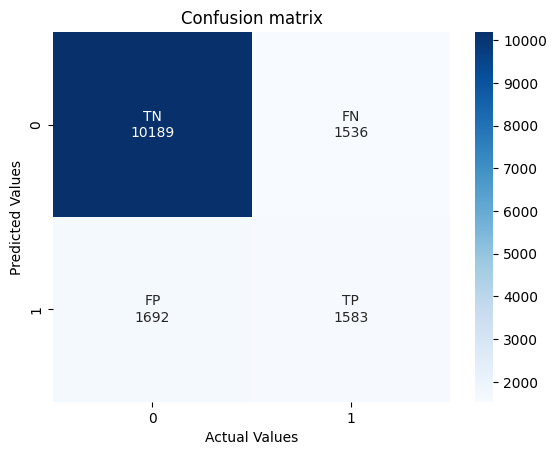

In [52]:
# Get probability predictions
prob_pred = final_xgb.predict_proba(X_test)[:, 1]

threshold = 0.3
y_pred_test = (prob_pred > threshold).astype(int) 

#----------------------------------------------------------

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(threshold, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

#--------------------------------------------------------

# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='Blues')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

#---------------------------------------------------------------- 

# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred_test)
m4_auc_rt = metrics.auc(fpr, tpr)

### ------------------------------------------------------------

# Calculate recall, accuracy, and specificity
m4_recall_rt = TP / (TP + FN)
m4_accuracy_rt = (TP + TN) / (TP + TN + FP + FN)
m4_precision_rt = TP / (TP + FP)
m4_specificity_rt = TN / (TN + FP)

print(f"Recall: {m4_recall_rt:.2f}")
print(f"Accuracy: {m4_accuracy_rt:.2f}")
print(f"Precision: {m4_precision_rt:.2f}")
print(f"Specificity: {m4_specificity_rt:.2f}")
print(f"AUC: {m4_auc_rt:.2f}")

## 3.5 Model #5: KNN
The K-Nearest Neighbors (KNN) algorithm is a non-parametric, instance-based learning method that classifies new observations based on their proximity to existing data points. Unlike ensemble methods such as Bagging, Random Forest, and Boosting, KNN does not build a predictive model during training. Instead, it stores the entire dataset and determines the class of a new instance by computing the distance to its K closest neighbors, typically using Euclidean distance.

The choice of K (number of neighbors) is critical: a small K makes the model highly sensitive to noise (high variance), while a large K smooths the decision boundary but may cause underfitting (high bias). KNN is computationally expensive for large datasets since it requires calculating distances for every new prediction. To optimize performance, feature scaling (e.g., standardization or normalization) is essential, as KNN relies on distance calculations that can be distorted by different feature magnitudes. This model is particularly useful when decision boundaries are non-linear, making it an effective method for classification tasks like predicting credit card customer defaults.

### 3.5.1 Dropping some variables since KNN doesn't works well with large quantity of estimators

We decide the variables to drop using the Importance Gain bar graph


In [53]:
# Defining the dataframe for KNN algorithm
df_KNN = df.drop(columns=['BILL_AMT5', 'BILL_AMT4', 'BILL_AMT3','BILL_AMT6', 'BILL_AMT2', 'AGE', 'MARRIAGE_single', 'EDUCATION_university', 'SEX_male', 'EDUCATION_high school', 'MARRIAGE_others', 'EDUCATION_others'])

### 3.5.2 Selecting the train and test data sets

In [54]:
# Separate features and target
X = df_KNN.drop(columns=['default_payment_next_month'])  # Features
y = df_KNN['default_payment_next_month']  # Target variable

# Split the data (80%: Train, 20%: Test)
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Check the size of the split data
print(f"Train size: {X_train.shape}, Test size: {X_test.shape}")

Train size: (24000, 20), Test size: (6000, 20)


### 3.5.3 Standarizing the estimators

In [55]:
# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


### 3.5.4 Model

In [56]:
#Initial model without knowing the optimal number of k

knn_classifier = KNeighborsClassifier(n_neighbors=4) # We use 4 as initial parameter
knn_classifier.fit(X_train, Y_train)

# Predictions (on test set, obviously)
knn_predictions = knn_classifier.predict(X_test)

# Calculate recall and print it
recall = recall_score(Y_test, knn_predictions)
print("% Recall (k=4): {0:.1%}".format(recall))

% Recall (k=4): 29.0%


### 3.5.5 Grid Search

In the K-Nearest Neighbors (KNN) model, we use Grid Search to optimize two key hyperparameters: n_neighbors and weights. The n_neighbors parameter, ranging from 1 to 50, determines how many nearest neighbors influence the classification, where smaller values increase model variance, making it sensitive to noise, while larger values smooth decision boundaries but may lead to underfitting. The weights parameter, tested with both "uniform" (equal influence for all neighbors) and "distance" (closer neighbors have higher importance), affects how neighbors contribute to predictions, with distance weighting often improving performance when instances are unevenly distributed. Here we test these combinations to find the optimal configuration, ensuring that KNN achieves the best balance between bias and variance for accurate customer default predictions

In [57]:
# Grid search
parameters = {
    "n_neighbors": range(1, 51),
    "weights": ["uniform", "distance"] # try with both options
}
gridsearch = GridSearchCV(KNeighborsClassifier(), parameters)
gridsearch.fit(X_train, Y_train) 

GridSearchCV(estimator=KNeighborsClassifier(), param_grid=parameters)

gridsearch.best_params_

{'n_neighbors': 50, 'weights': 'uniform'}

### 3.5.6 Model after Grid Search

In [58]:
# Apply prediction 
train_preds_grid = gridsearch.predict(X_train)

gridpredictions = gridsearch.predict(X_test) #probability of being in both groups
recall = recall_score(Y_test, gridpredictions)
print("% Recall (grid search): {0:.1%}".format(recall))

% Recall (grid search): 35.1%


### 3.5.7 Confusion Matrix

Text(50.722222222222214, 0.5, 'Predicted Values')

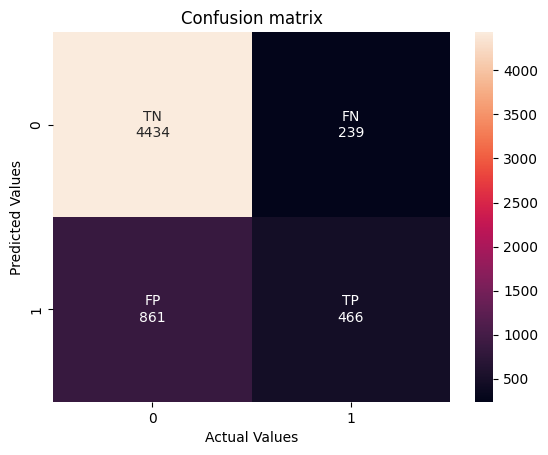

In [59]:
# Confusion Matrix
conf_mat = confusion_matrix(Y_test, gridpredictions)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

### 3.5.8 Precision and Recall

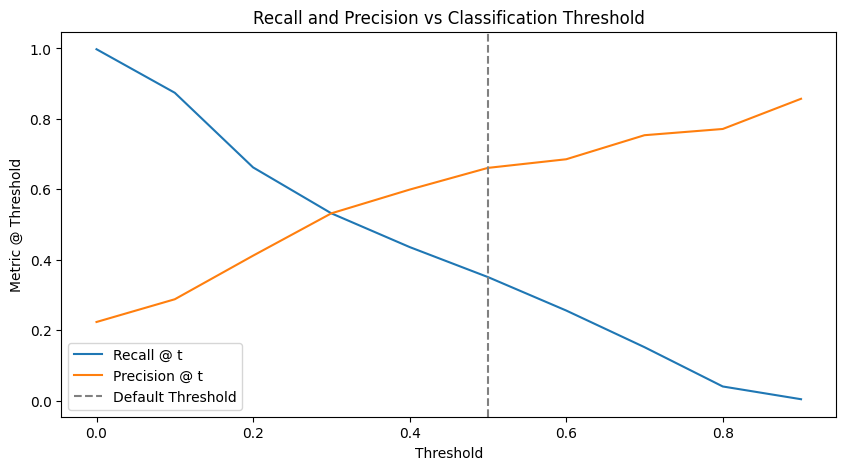

In [60]:
# Get probability predictions
prob_pred = gridsearch.predict_proba(X_test)[:, 1]

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

### 3.5.9 ROC Curve

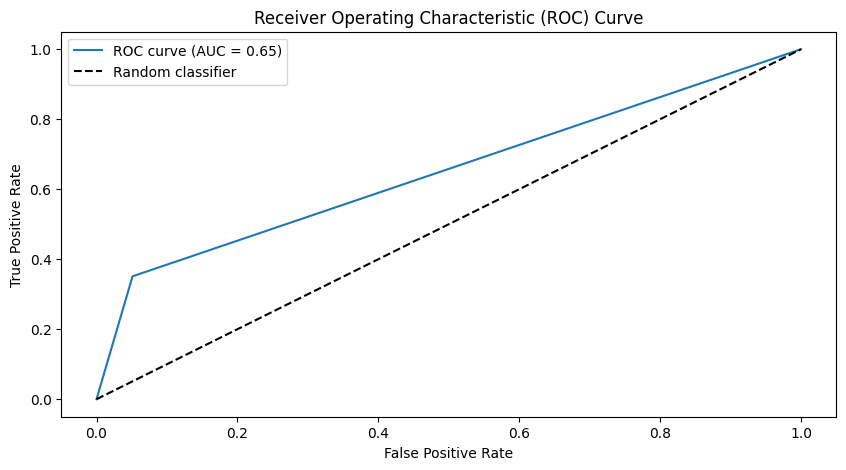

In [61]:
# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, gridpredictions)
m5_auc = metrics.auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {m5_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### 3.5.10 Model #5: Performance

In [62]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, gridpredictions)

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate recall, accuracy, and specificity
m5_recall = TP / (TP + FN)
m5_accuracy = (TP + TN) / (TP + TN + FP + FN)
m5_precision = TP / (TP + FP)
m5_specificity = TN / (TN + FP)

print(f"Recall: {m5_recall:.2f}")
print(f"Accuracy: {m5_accuracy:.2f}")
print(f"Precision: {m5_precision:.2f}")
print(f"Specificity: {m5_specificity:.2f}")
print(f"AUC: {m5_auc:.2f}")

Recall: 0.35
Accuracy: 0.82
Precision: 0.66
Specificity: 0.95
AUC: 0.65


### 3.5.11 Model #5: Overall Performance reducing the threshold (0.3)

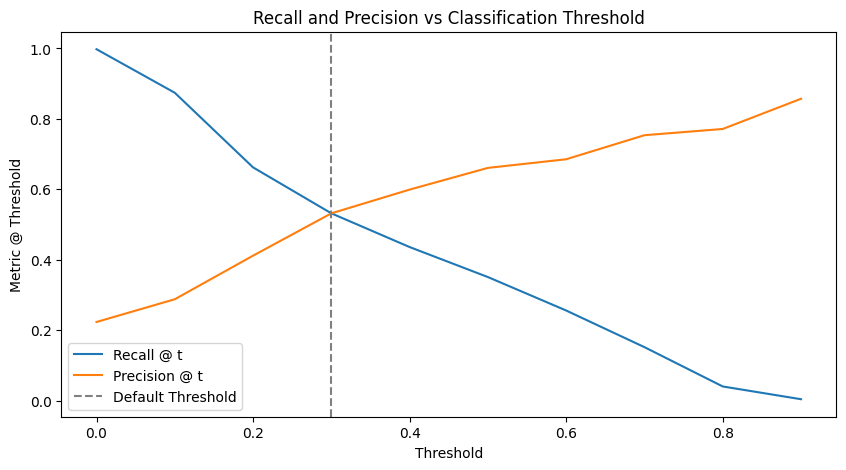

Recall: 0.35
Accuracy: 0.82
Precision: 0.66
Specificity: 0.95
AUC: 0.70


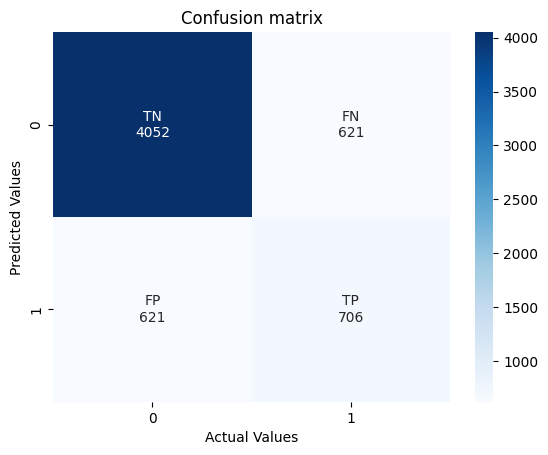

In [63]:
# Get probability predictions
prob_pred = gridsearch.predict_proba(X_test)[:, 1]

threshold = 0.3
y_pred_test = (prob_pred > threshold).astype(int) 

#----------------------------------------------------------

# Calculate recall and precision scores for different thresholds
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

# Plot recall and precision curves
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(threshold, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_title("Recall and Precision vs Classification Threshold")
ax.legend()
plt.show()

#--------------------------------------------------------

# Confusion Matrix
conf_mat = confusion_matrix(Y_test, y_pred_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='Blues')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')

# Extract true negatives, false positives, false negatives, and true positives
TN, FP, FN, TP = conf_matrix.ravel()

#---------------------------------------------------------------- 

# Calculate false positive rate and true positive rate for ROC curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test, y_pred_test)
m5_auc_rt = metrics.auc(fpr, tpr)

### ------------------------------------------------------------

# Calculate recall, accuracy, and specificity
m5_recall_rt = TP / (TP + FN)
m5_accuracy_rt = (TP + TN) / (TP + TN + FP + FN)
m5_precision_rt = TP / (TP + FP)
m5_specificity_rt = TN / (TN + FP)

print(f"Recall: {m5_recall_rt:.2f}")
print(f"Accuracy: {m5_accuracy_rt:.2f}")
print(f"Precision: {m5_precision_rt:.2f}")
print(f"Specificity: {m5_specificity_rt:.2f}")
print(f"AUC: {m5_auc_rt:.2f}")

# 4. Model Comparison

To determine the best model for predicting credit card customer defaults, we compare the performance of Decision Trees, Bagging, Random Forest, Boosting, and KNN using three key metrics: AUC (Area Under the Curve), Recall, and Accuracy. AUC measures the model’s ability to distinguish between defaulters and non-defaulters across different thresholds, providing a more comprehensive assessment than accuracy alone. Recall is prioritized in our business case, as it ensures that we correctly identify as many defaulters as possible, reducing false negatives and minimizing financial risk. While increasing recall can lead to more false positives, this trade-off is necessary to capture high-risk customers who might otherwise go undetected. Accuracy, though useful as a general performance measure, can be misleading in imbalanced datasets, so it must be interpreted alongside AUC and Recall. By analyzing these metrics across all models, we identify the algorithm that best balances predictive power, generalization, and the ability to detect defaulters effectively.

Finally, we compare the models both before and after threshold tuning, assessing the impact of lowering the classification threshold to improve recall. Initially, models use the default 0.5 threshold, which balances precision and recall but may fail to identify a significant number of defaulters. By reducing the threshold, we increase the model’s sensitivity, ensuring more actual defaulters are correctly classified and minimizing false negatives, which is critical in credit risk assessment. However, this adjustment comes with a trade-off, as a lower threshold increases false positives, potentially misclassifying reliable customers as defaulters. By comparing models under both approaches, we evaluate how threshold tuning enhances recall while maintaining an acceptable precision level, ultimately selecting the best model for detecting credit card customer defaults.

## 4.1 Models Performance (threshold = 0.5)

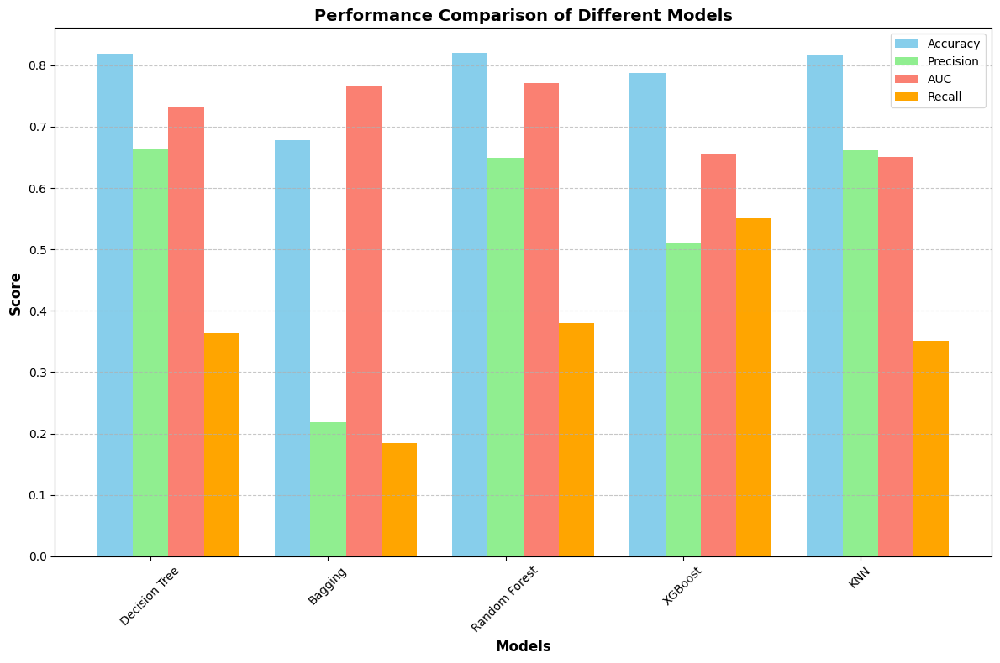

Model Performance Metrics:
        Model  Accuracy  Precision   Recall      AUC
Decision Tree  0.818533   0.664459 0.362869 0.732310
      Bagging  0.678200   0.218841 0.184427 0.766125
Random Forest  0.819733   0.649242 0.379237 0.770279
      XGBoost  0.787200   0.511786 0.550229 0.656630
          KNN  0.816667   0.660993 0.351168 0.650012


In [64]:

# Collect metrics from all models
models = ['Decision Tree', 'Bagging', 'Random Forest', 'XGBoost', 'KNN']

# Assuming the following variables exist from previous cells:
# m1_accuracy, m1_precision, m1_auc (Decision Tree)
# m2_accuracy, m2_precision, m2_auc (Bagging)
# m3_accuracy, m3_precision, m3_auc (Random Forest)
# m4_accuracy, m4_precision, m4_auc (XGBoost)
# m5_accuracy, m5_precision, m5_auc (KNN)

# Create a dictionary with the metrics
metrics_dict = {
    'Model': models,
    'Accuracy': [m1_accuracy, m2_accuracy, m3_accuracy, m4_accuracy, m5_accuracy],
    'Precision': [m1_precision, m2_precision, m3_precision, m4_precision, m5_precision],
    'Recall': [m1_recall, m2_recall, m3_recall, m4_recall, m5_recall],
    'AUC': [m1_auc, m2_auc, m3_auc, m4_auc, m5_auc]
}

# Create a DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Set up the figure
plt.figure(figsize=(12, 8))

# Set width of bars
barWidth = 0.2

# Set positions of the bars on X axis
r1 = np.arange(len(models))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

# Create bars
plt.bar(r1, metrics_df['Accuracy'], width=barWidth, label='Accuracy', color='skyblue')
plt.bar(r2, metrics_df['Precision'], width=barWidth, label='Precision', color='lightgreen')
plt.bar(r3, metrics_df['AUC'], width=barWidth, label='AUC', color='salmon')
plt.bar(r4, metrics_df['Recall'], width=barWidth, label='Recall', color='orange')

# Add labels and title
plt.xlabel('Models', fontweight='bold', fontsize=12)
plt.ylabel('Score', fontweight='bold', fontsize=12)
plt.title('Performance Comparison of Different Models', fontweight='bold', fontsize=14)
plt.xticks([r + barWidth for r in range(len(models))], models, rotation=45)

# Add a legend
plt.legend()

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ensure the plot is displayed within bounds
plt.tight_layout()

# Display the plot
plt.show()

# Display the metrics in a table format
print("Model Performance Metrics:")
print(metrics_df.to_string(index=False))


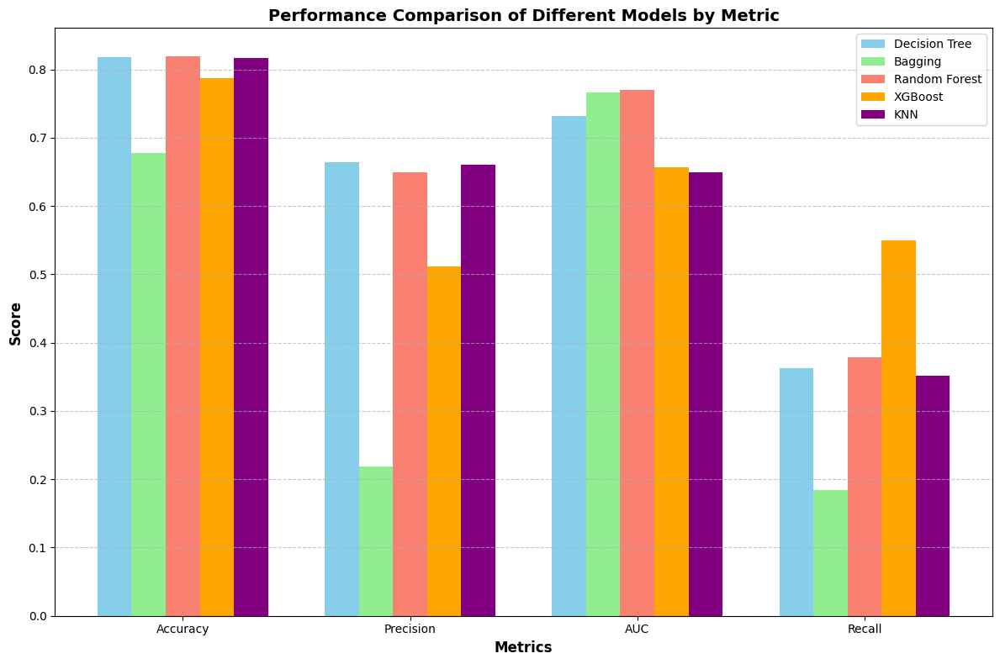

In [65]:
# Create a transposed view for plotting metrics as x-axis
plt.figure(figsize=(12, 8))

# Set width of bars
barWidth = 0.15

# Set positions of the bars on X axis
metrics = ['Accuracy', 'Precision', 'AUC', 'Recall']
r1 = np.arange(len(metrics))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]

# Create bars for each model
plt.bar(r1, [m1_accuracy, m1_precision, m1_auc, m1_recall], width=barWidth, label=models[0], color='skyblue')
plt.bar(r2, [m2_accuracy, m2_precision, m2_auc, m2_recall], width=barWidth, label=models[1], color='lightgreen')
plt.bar(r3, [m3_accuracy, m3_precision, m3_auc, m3_recall], width=barWidth, label=models[2], color='salmon')
plt.bar(r4, [m4_accuracy, m4_precision, m4_auc, m4_recall], width=barWidth, label=models[3], color='orange')
plt.bar(r5, [m5_accuracy, m5_precision, m5_auc, m5_recall], width=barWidth, label=models[4], color='purple')

# Add labels and title
plt.xlabel('Metrics', fontweight='bold', fontsize=12)
plt.ylabel('Score', fontweight='bold', fontsize=12)
plt.title('Performance Comparison of Different Models by Metric', fontweight='bold', fontsize=14)
plt.xticks([r + barWidth*2 for r in range(len(metrics))], metrics, fontsize=10)

# Add a legend
plt.legend(loc='best')

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ensure the plot is displayed within bounds
plt.tight_layout()

# Display the plot
plt.show()


## 4.2 Models with threshold tuninng performance

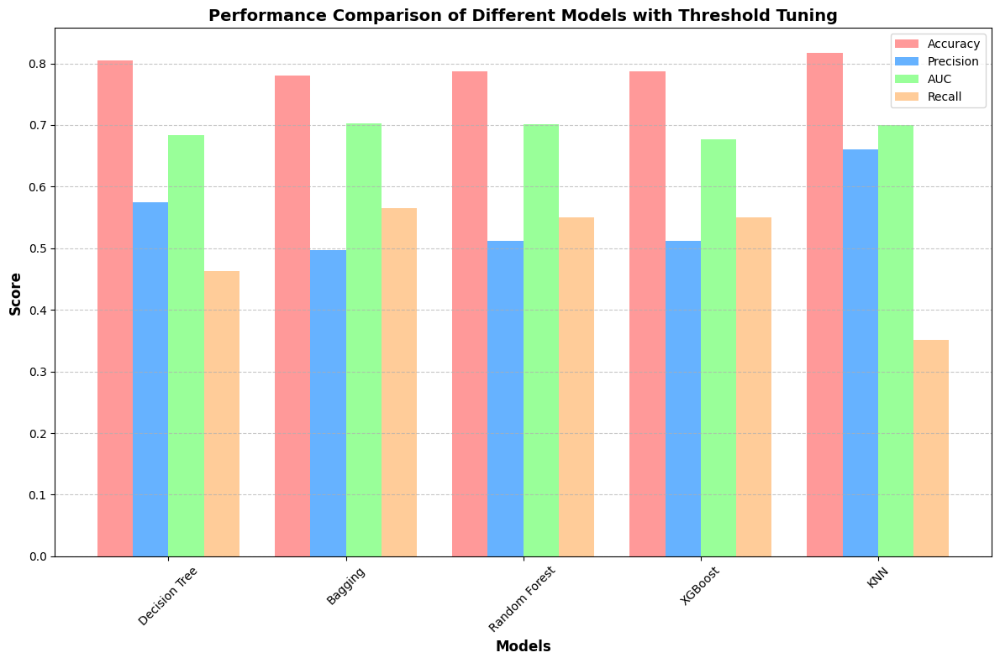

In [66]:
# Collect metrics from all models
models = ['Decision Tree', 'Bagging', 'Random Forest', 'XGBoost', 'KNN']

# Assuming the following variables exist from previous cells:
# m1_accuracy_rt, m1_precision_rt, m1_auc_rt (Decision Tree)
# m2_accuracy_rt, m2_precision_rt, m2_auc_rt (Bagging)
# m3_accuracy_rt, m3_precision_rt, m3_auc_rt (Random Forest)
# m4_accuracy_rt, m4_precision_rt, m4_auc_rt (XGBoost)
# m5_accuracy_rt, m5_precision_rt, m5_auc_rt (KNN)

# Create a dictionary with the metrics
metrics_dict = {
    'Model': models,
    'Accuracy': [m1_accuracy_rt, m2_accuracy_rt, m3_accuracy_rt, m4_accuracy_rt, m5_accuracy_rt],
    'Precision': [m1_precision_rt, m2_precision_rt, m3_precision_rt, m4_precision_rt, m5_precision_rt],
    'Recall': [m1_recall_rt, m2_recall_rt, m3_recall_rt, m4_recall_rt, m5_recall_rt],
    'AUC': [m1_auc_rt, m2_auc_rt, m3_auc_rt, m4_auc_rt, m5_auc_rt]
}

# Create a DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Set up the figure
plt.figure(figsize=(12, 8))

# Set width of bars
barWidth = 0.2

# Set positions of the bars on X axis
r1 = np.arange(len(models))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

# Create bars with new colors
plt.bar(r1, metrics_df['Accuracy'], width=barWidth, label='Accuracy', color='#FF9999')  # Light red
plt.bar(r2, metrics_df['Precision'], width=barWidth, label='Precision', color='#66B2FF')  # Light blue
plt.bar(r3, metrics_df['AUC'], width=barWidth, label='AUC', color='#99FF99')  # Light green
plt.bar(r4, metrics_df['Recall'], width=barWidth, label='Recall', color='#FFCC99')  # Light orange

# Add labels and title
plt.xlabel('Models', fontweight='bold', fontsize=12)
plt.ylabel('Score', fontweight='bold', fontsize=12)
plt.title('Performance Comparison of Different Models with Threshold Tuning', fontweight='bold', fontsize=14)
plt.xticks([r + barWidth*1.5 for r in range(len(models))], models, rotation=45)

# Add a legend
plt.legend()

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ensure the plot is displayed within bounds
plt.tight_layout()

# Display the plot
plt.show()

,Accuracy,Precision,Recall,AUC
Model,,,,
Decision Tree,0.805267,0.574095,0.463532,0.682930
Bagging,0.780467,0.497579,0.564885,0.702784
Random Forest,0.787200,0.511786,0.550229,0.701810
XGBoost,0.787200,0.511786,0.550229,0.676178
KNN,0.816667,0.660993,0.351168,0.699568


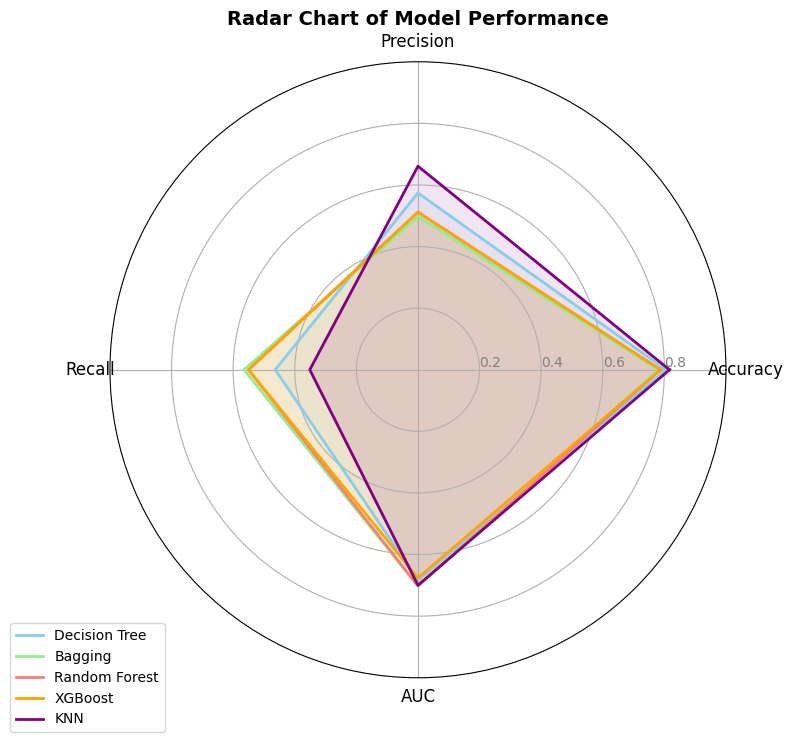

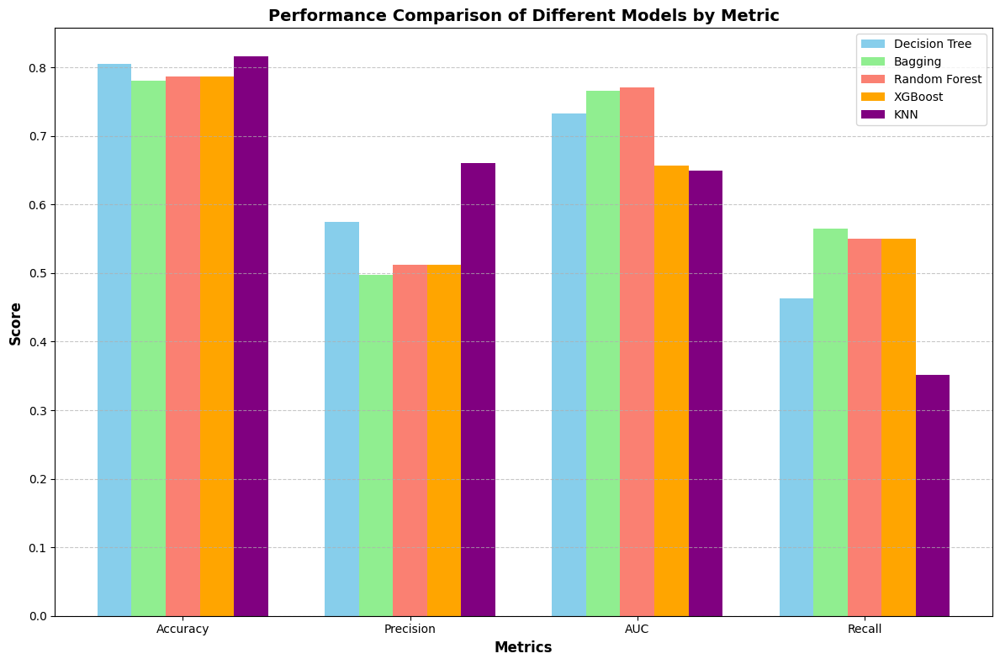

In [67]:
# Create a table to display the metrics
metrics_table = metrics_df.set_index('Model')
display(metrics_table)

# Create a radar chart to visualize model performance across metrics
from math import pi

# Set data
categories = ['Accuracy', 'Precision', 'Recall', 'AUC']
N = len(categories)

# Create angles for each metric
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]  # Close the loop

# Create figure
plt.figure(figsize=(12, 8))
ax = plt.subplot(111, polar=True)

# Draw one axis per variable and add labels
plt.xticks(angles[:-1], categories, size=12)

# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([0.2, 0.4, 0.6, 0.8], ["0.2", "0.4", "0.6", "0.8"], color="grey", size=10)
plt.ylim(0, 1)

# Plot each model
colors = ['skyblue', 'lightgreen', 'salmon', 'orange', 'purple']
for i, model in enumerate(models):
    values = [metrics_df.loc[i, 'Accuracy'], metrics_df.loc[i, 'Precision'], 
              metrics_df.loc[i, 'Recall'], metrics_df.loc[i, 'AUC']]
    values += values[:1]  # Close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=model, color=colors[i])
    ax.fill(angles, values, alpha=0.1, color=colors[i])

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.title('Radar Chart of Model Performance', fontweight='bold', fontsize=14)
plt.show()


# Create a transposed view for plotting metrics as x-axis
plt.figure(figsize=(12, 8))

# Set width of bars
barWidth = 0.15

# Set positions of the bars on X axis
metrics = ['Accuracy', 'Precision', 'AUC', 'Recall']
r1 = np.arange(len(metrics))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]

# Create bars for each model
plt.bar(r1, [m1_accuracy_rt, m1_precision_rt, m1_auc, m1_recall_rt], width=barWidth, label=models[0], color='skyblue')
plt.bar(r2, [m2_accuracy_rt, m2_precision_rt, m2_auc, m2_recall_rt], width=barWidth, label=models[1], color='lightgreen')
plt.bar(r3, [m3_accuracy_rt, m3_precision_rt, m3_auc, m3_recall_rt], width=barWidth, label=models[2], color='salmon')
plt.bar(r4, [m4_accuracy_rt, m4_precision_rt, m4_auc, m4_recall_rt], width=barWidth, label=models[3], color='orange')
plt.bar(r5, [m5_accuracy_rt, m5_precision_rt, m5_auc, m5_recall_rt ], width=barWidth, label=models[4], color='purple')

# Add labels and title
plt.xlabel('Metrics', fontweight='bold', fontsize=12)
plt.ylabel('Score', fontweight='bold', fontsize=12)
plt.title('Performance Comparison of Different Models by Metric', fontweight='bold', fontsize=14)
plt.xticks([r + barWidth*2 for r in range(len(metrics))], metrics, fontsize=10)

# Add a legend
plt.legend(loc='best')

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ensure the plot is displayed within bounds
plt.tight_layout()

# Display the plot
plt.show()